# Supplementary Visualization Notebook

This notebook visualizes the model pipeline one step at a time. Each pipeline step is a separate executable cell so a supplementary figure can be captured directly from the corresponding output.

Default behavior uses one Cityscapes image. To visualize four or five images, set `NUM_SAMPLES = 4` or `NUM_SAMPLES = 5` and add stems to `SAMPLE_STEMS`.

The notebook is organized into three blocks:

1. Pseudo-label generation, from RGB/depth inputs through DCFA, depth connected components, SIMCF, and the final panoptic pseudo-label.
2. Stage-2 panoptic bootstrapping, including pseudo-label supervision, copy-paste source extraction, copy-paste augmentation, and void/DropLoss masks.
3. Stage-3 panoptic network training, including EMA-teacher source labels when available and self-enhanced copy-paste augmentation.

## 0. Setup

In [1]:
from pathlib import Path
import sys
import json
import math
import os
import re

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage
from scipy.ndimage import sobel, gaussian_filter

PROJECT_ROOT = Path("/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation")
CITYSCAPES_ROOT = Path("/Users/qbit-glitch/Desktop/datasets/cityscapes")
CUPS_ROOT = PROJECT_ROOT / "refs" / "cups"
for path in [PROJECT_ROOT, CUPS_ROOT]:
    path_str = str(path)
    if path_str not in sys.path:
        sys.path.insert(0, path_str)
os.environ.setdefault("WANDB_MODE", "disabled")

try:
    import torch
    HAS_TORCH = True
except Exception as exc:
    torch = None
    HAS_TORCH = False
    print(f"Torch unavailable; checkpoint cells will report paths only: {exc}")

from mbps.data.copy_paste import copy_paste_augment, create_self_enhanced_source
try:
    from mbps.data.copy_paste import _extract_instances
except Exception:
    _extract_instances = None

plt.rcParams["figure.dpi"] = 120
plt.rcParams["font.size"] = 9

NUM_SAMPLES = 1
SAMPLE_STEMS = ["zurich_000095_000019"]

RNG_SEED = 42
PATCH_SIZE = 16
TAU_D = 0.20
A_MIN = 1000
SIMCF_TAU = 0.85
SIMCF_ETA = 2.5

# Loading the panoptic network checkpoints can consume several GB of RAM.
# Keep this false for visualization-only runs; set true when making the
# full reproducibility notebook later.
LOAD_HEAVY_NETWORK_CKPTS = False

# Set this to False if your notebook kernel does not have the CUPS/Detectron2
# environment available. When True, the raw Stage-2/Stage-3 overlay cells pass
# the selected image through the detector and then overlay the prediction.
RUN_ONE_IMAGE_STAGE_NETWORK_INFERENCE = True

# Keep False for figure generation: the overlay cells should show the detector
# path, not a silent file lookup. Set True only when you want fast re-rendering
# from previously generated semantic/instance PNGs.
USE_STAGE_OUTPUT_CACHE_IF_AVAILABLE = False

SAVE_CELL_OUTPUTS = True
CELL_OUTPUT_DIR = PROJECT_ROOT / "figures" / "supplementary_notebook_outputs"
CELL_OUTPUT_DPI = 220

## 0.1 Artifact roots and checkpoints

In [2]:
PATHS = {
    "rgb": CITYSCAPES_ROOT / "leftImg8bit",
    "depthpro": CITYSCAPES_ROOT / "depth_depthpro",
    "cause_codes": CITYSCAPES_ROOT / "cause_codes_90d",
    "raw_sem_k80": CITYSCAPES_ROOT / "pseudo_semantic_raw_k80",
    "dcfa_sem_k80": CITYSCAPES_ROOT / "pseudo_semantic_adapter_V3_k80",
    "standalone_depth_cc_instances": CITYSCAPES_ROOT / "pseudo_instance_depthpro",
    "raw_candidate_cups": CITYSCAPES_ROOT / "cups_pseudo_labels_adapter_V3_tau020",
    "final_simcf_cups": CITYSCAPES_ROOT / "cups_pseudo_labels_dcfa_simcf_abc",
    "dinov3_features": CITYSCAPES_ROOT / "dinov3_features",
    "stage2_raw_outputs": PROJECT_ROOT / "results/stage2_visualization_cache",
    "stage3_raw_outputs": PROJECT_ROOT / "results/stage3_visualization_cache",
}

CHECKPOINTS = {
    "dcfa_adapter": PROJECT_ROOT / "results/depth_adapter/V3_dd16_h384_l2/best.pt",
    "stage2_panoptic_bootstrap": PROJECT_ROOT / "checkpoints/dinov3_vitb_depthpro_tau020_stage2/best_pq_28.40_step2821.ckpt",
    "stage3_panoptic_network": PROJECT_ROOT / "checkpoints/stage3_dcfa_simcf_abc/best_pq_step=003000.ckpt",
}

for name, path in PATHS.items():
    print(f"{name:24s}: {path} {'OK' if path.exists() else 'MISSING'}")
print()
for name, path in CHECKPOINTS.items():
    size = path.stat().st_size / (1024 ** 2) if path.exists() else 0
    print(f"{name:24s}: {path} {'OK' if path.exists() else 'MISSING'} ({size:.1f} MB)")

rgb                     : /Users/qbit-glitch/Desktop/datasets/cityscapes/leftImg8bit OK
depthpro                : /Users/qbit-glitch/Desktop/datasets/cityscapes/depth_depthpro OK
cause_codes             : /Users/qbit-glitch/Desktop/datasets/cityscapes/cause_codes_90d OK
raw_sem_k80             : /Users/qbit-glitch/Desktop/datasets/cityscapes/pseudo_semantic_raw_k80 OK
dcfa_sem_k80            : /Users/qbit-glitch/Desktop/datasets/cityscapes/pseudo_semantic_adapter_V3_k80 OK
standalone_depth_cc_instances: /Users/qbit-glitch/Desktop/datasets/cityscapes/pseudo_instance_depthpro OK
raw_candidate_cups      : /Users/qbit-glitch/Desktop/datasets/cityscapes/cups_pseudo_labels_adapter_V3_tau020 OK
final_simcf_cups        : /Users/qbit-glitch/Desktop/datasets/cityscapes/cups_pseudo_labels_dcfa_simcf_abc OK
dinov3_features         : /Users/qbit-glitch/Desktop/datasets/cityscapes/dinov3_features OK
stage2_raw_outputs      : /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/resul

## 0.2 CUPS detector environment check

In [3]:
print("PROJECT_ROOT:", PROJECT_ROOT)
print("CUPS_ROOT:", CUPS_ROOT, "OK" if CUPS_ROOT.exists() else "MISSING")
print("python:", sys.executable)

try:
    import cups
    print("cups import: OK", cups.__file__)
except Exception as exc:
    print("cups import: FAILED", type(exc).__name__, exc)

try:
    import detectron2
    print("detectron2 import: OK")
except Exception as exc:
    print("detectron2 import: FAILED", type(exc).__name__, exc)

try:
    import yacs
    print("yacs import: OK")
except Exception as exc:
    print("yacs import: FAILED", type(exc).__name__, exc)

try:
    import pytorch_lightning
    print("pytorch_lightning import: OK")
except Exception as exc:
    print("pytorch_lightning import: FAILED", type(exc).__name__, exc)

PROJECT_ROOT: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation
CUPS_ROOT: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/refs/cups OK
python: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/.venv/bin/python


/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cups import: OK /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/refs/cups/cups/__init__.py
detectron2 import: OK
yacs import: OK
pytorch_lightning import: OK


## 0.3 Visualization helpers

In [4]:
CS_COLORS = {
    0: (128, 64, 128), 1: (244, 35, 232), 2: (70, 70, 70), 3: (102, 102, 156),
    4: (190, 153, 153), 5: (153, 153, 153), 6: (250, 170, 30), 7: (220, 220, 0),
    8: (107, 142, 35), 9: (152, 251, 152), 10: (70, 130, 180), 11: (220, 20, 60),
    12: (255, 0, 0), 13: (0, 0, 142), 14: (0, 0, 70), 15: (0, 60, 100),
    16: (0, 80, 100), 17: (0, 0, 230), 18: (119, 11, 32),
}
THING_IDS = set(range(11, 19))
STUFF_IDS = set(range(0, 11))

def strip_left_suffix(stem):
    return stem[:-12] if stem.endswith("_leftImg8bit") else stem

def city_from_stem(stem):
    return strip_left_suffix(stem).split("_")[0]

def find_first(root, patterns):
    for pattern in patterns:
        matches = sorted(root.glob(pattern))
        if matches:
            return matches[0]
    return None

def read_image(path, mode=None):
    if path is None or not Path(path).exists():
        return None
    img = Image.open(path)
    if mode is not None:
        img = img.convert(mode)
    return np.array(img)

def read_npy(path):
    if path is None or not Path(path).exists():
        return None
    return np.load(path)

def read_label_any(path):
    if path is None or not Path(path).exists():
        return None
    if Path(path).suffix == ".npy":
        return np.load(path)
    return read_image(path)

def normalize01(arr):
    if arr is None:
        return None
    arr = arr.astype(np.float32)
    lo, hi = np.nanmin(arr), np.nanmax(arr)
    if hi - lo < 1e-8:
        return np.zeros_like(arr, dtype=np.float32)
    return (arr - lo) / (hi - lo)

def normalize_channels(arr):
    if arr is None:
        return None
    arr = arr.astype(np.float32)
    out = np.zeros_like(arr, dtype=np.float32)
    for c in range(arr.shape[-1]):
        out[..., c] = normalize01(arr[..., c])
    return out

def channel_contact_sheet(arr, ncols=4, gap=2):
    if arr is None:
        return None
    arr = normalize_channels(arr)
    h, w, c = arr.shape
    nrows = int(math.ceil(c / ncols))
    sheet = np.zeros((nrows * h + (nrows - 1) * gap, ncols * w + (ncols - 1) * gap), dtype=np.float32)
    for idx in range(c):
        row = idx // ncols
        col = idx % ncols
        y0 = row * (h + gap)
        x0 = col * (w + gap)
        sheet[y0:y0 + h, x0:x0 + w] = arr[..., idx]
    return sheet

def pca_rgb(features):
    if features is None:
        return None
    h, w, c = features.shape
    flat = features.reshape(-1, c).astype(np.float32)
    flat = flat - flat.mean(axis=0, keepdims=True)
    try:
        _, _, vt = np.linalg.svd(flat, full_matrices=False)
        projected = flat @ vt[:3].T
    except np.linalg.LinAlgError:
        projected = flat[:, :3]
    projected = projected.reshape(h, w, 3)
    projected = normalize_channels(projected)
    return (projected * 255).clip(0, 255).astype(np.uint8)

def resize_nearest(arr, shape_hw):
    if arr is None:
        return None
    h, w = shape_hw
    return np.array(Image.fromarray(arr).resize((w, h), Image.NEAREST))

def dcfa_depth_encoding(sample):
    depth = sample["cause_depth"]
    if depth is None:
        depth = sample["depth"]
    if depth is None:
        return None
    depth = normalize01(depth)
    channels = []
    for k in range(8):
        omega = (2 ** k) * np.pi
        channels.append(np.sin(omega * depth))
        channels.append(np.cos(omega * depth))
    return np.stack(channels, axis=-1).astype(np.float32)

DCFA_ADAPTER = None
DCFA_DEPTH_ENCODE_FN = None

def load_dcfa_adapter():
    global DCFA_ADAPTER, DCFA_DEPTH_ENCODE_FN
    if DCFA_ADAPTER is not None:
        return DCFA_ADAPTER
    if not HAS_TORCH or not CHECKPOINTS["dcfa_adapter"].exists():
        return None
    from mbps_pytorch.models.semantic.depth_adapter import DepthAdapter, sinusoidal_depth_encode
    raw = torch.load(CHECKPOINTS["dcfa_adapter"], map_location="cpu")
    state = raw.get("state_dict", raw) if isinstance(raw, dict) else raw
    first_w = state["mlp.0.weight"]
    hidden_dim = int(first_w.shape[0])
    depth_dim = int(first_w.shape[1] - 90)
    n_layers = sum(
        1 for key in state
        if key.startswith("mlp.") and key.endswith(".weight")
        and key.split(".")[1].isdigit() and int(key.split(".")[1]) % 3 == 0
    )
    DCFA_ADAPTER = DepthAdapter(code_dim=90, depth_dim=depth_dim, hidden_dim=hidden_dim, num_layers=n_layers)
    DCFA_ADAPTER.load_state_dict(state)
    DCFA_ADAPTER.eval()
    DCFA_DEPTH_ENCODE_FN = sinusoidal_depth_encode if depth_dim >= 16 else None
    print(f"Loaded DCFA adapter for visualization: depth_dim={depth_dim}, hidden_dim={hidden_dim}, layers={n_layers}")
    return DCFA_ADAPTER

DCFA_FEATURE_CACHE = {}

def dcfa_features(sample):
    if sample["cause_codes"] is None or sample["cause_depth"] is None:
        return None
    key = sample["stem"]
    if key in DCFA_FEATURE_CACHE:
        return DCFA_FEATURE_CACHE[key]
    adapter = load_dcfa_adapter()
    if adapter is None:
        return None
    codes = sample["cause_codes"].astype(np.float32)
    h, w, c = codes.shape
    depth = normalize01(sample["cause_depth"]).astype(np.float32)
    if depth.shape != (h, w):
        depth = np.array(Image.fromarray(depth).resize((w, h), Image.BILINEAR)).astype(np.float32)
    with torch.no_grad():
        codes_t = torch.from_numpy(codes.reshape(1, h * w, c))
        depth_flat = torch.from_numpy(depth.reshape(1, h * w))
        if getattr(adapter, "depth_dim", 1) >= 16:
            depth_t = DCFA_DEPTH_ENCODE_FN(depth_flat)
        else:
            depth_t = depth_flat.unsqueeze(-1)
        adapted_t = adapter(codes_t, depth_t)
    adapted = adapted_t.squeeze(0).numpy().reshape(h, w, c)
    residual = adapted - codes
    DCFA_FEATURE_CACHE[key] = {"adapted": adapted, "residual": residual}
    return DCFA_FEATURE_CACHE[key]

def sem_to_color(sem):
    if sem is None:
        return None
    sem = sem.astype(np.int32)
    out = np.zeros((*sem.shape, 3), dtype=np.uint8)
    rng = np.random.RandomState(7)
    cluster_colors = rng.randint(30, 240, size=(256, 3), dtype=np.uint8)
    for value in np.unique(sem):
        value = int(value)
        if value == 255:
            out[sem == value] = (0, 0, 0)
        elif value in CS_COLORS:
            out[sem == value] = CS_COLORS[value]
        else:
            out[sem == value] = cluster_colors[value % 256]
    return out

def inst_to_color(inst):
    if inst is None:
        return None
    inst = inst.astype(np.int64)
    out = np.zeros((*inst.shape, 3), dtype=np.uint8)
    ids = [int(x) for x in np.unique(inst) if x > 0]
    rng = np.random.RandomState(42)
    colors = rng.randint(50, 255, size=(max(len(ids), 1) + 1, 3), dtype=np.uint8)
    for idx, instance_id in enumerate(ids):
        out[inst == instance_id] = colors[idx]
    return out

def overlay(rgb, color, alpha=0.50):
    if rgb is None or color is None:
        return None
    if rgb.shape[:2] != color.shape[:2]:
        rgb = np.array(Image.fromarray(rgb).resize((color.shape[1], color.shape[0]), Image.BILINEAR))
    return ((1 - alpha) * rgb.astype(np.float32) + alpha * color.astype(np.float32)).clip(0, 255).astype(np.uint8)

def panoptic_preview(sem, inst):
    if sem is None or inst is None:
        return None
    sem = resize_nearest(sem, inst.shape)
    base = sem_to_color(sem)
    inst_color = inst_to_color(inst)
    thing_mask = inst > 0
    out = base.copy()
    out[thing_mask] = inst_color[thing_mask]
    return out

STAGE2_BASE_HW = (640, 1280)
STAGE2_JITTER_HWS = [(384, 768), (416, 832), (448, 896), (480, 960), (512, 1024)]
STAGE3_TTA_SCALES = (0.5, 0.75, 1.0)
STAGE3_JITTER_HWS = [(384, 768), (416, 832), (448, 896)]
FIGURE_SAVE_COUNTER = 0

def slugify_title(title, max_len=90):
    title = str(title).strip().lower()
    title = re.sub(r"[^a-z0-9]+", "_", title)
    title = title.strip("_")
    return (title[:max_len].strip("_") or "figure")

def save_notebook_figure(fig, title):
    global FIGURE_SAVE_COUNTER
    if not SAVE_CELL_OUTPUTS:
        return None
    CELL_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    FIGURE_SAVE_COUNTER += 1
    out_path = CELL_OUTPUT_DIR / f"{FIGURE_SAVE_COUNTER:03d}_{slugify_title(title)}.png"
    fig.savefig(out_path, bbox_inches="tight", dpi=CELL_OUTPUT_DPI)
    print(f"saved figure: {out_path}")
    return out_path

def resize_rgb_arr(rgb, shape_hw):
    h, w = shape_hw
    return np.array(Image.fromarray(rgb.astype(np.uint8)).resize((w, h), Image.BILINEAR))

def resize_float_arr(arr, shape_hw):
    if arr is None:
        return None
    h, w = shape_hw
    return np.array(Image.fromarray(arr.astype(np.float32)).resize((w, h), Image.BILINEAR)).astype(np.float32)

def resize_label_arr(label, shape_hw):
    if label is None:
        return None
    h, w = shape_hw
    return np.array(Image.fromarray(label.astype(np.int32)).resize((w, h), Image.NEAREST)).astype(np.int32)

def full_state_from_sample(sample, sem_key="final_sem", inst_key="final_inst"):
    rgb = sample["rgb"].astype(np.uint8)
    hw = rgb.shape[:2]
    depth = sample["depth"]
    return {
        "rgb": rgb,
        "depth": resize_float_arr(normalize01(depth), hw) if depth is not None else None,
        "sem": resize_label_arr(sample[sem_key], hw),
        "inst": resize_label_arr(sample[inst_key], hw),
        "stem": sample["stem"],
    }

def resize_vis_state(state, shape_hw):
    return {
        **state,
        "rgb": resize_rgb_arr(state["rgb"], shape_hw),
        "depth": resize_float_arr(state.get("depth"), shape_hw),
        "sem": resize_label_arr(state.get("sem"), shape_hw),
        "inst": resize_label_arr(state.get("inst"), shape_hw),
    }

def pad_to_min(arr, target_hw):
    th, tw = target_hw
    h, w = arr.shape[:2]
    pad_h = max(0, th - h)
    pad_w = max(0, tw - w)
    if pad_h == 0 and pad_w == 0:
        return arr
    pad_spec = ((pad_h // 2, pad_h - pad_h // 2), (pad_w // 2, pad_w - pad_w // 2))
    if arr.ndim == 3:
        pad_spec = pad_spec + ((0, 0),)
    return np.pad(arr, pad_spec, mode="edge")

def center_crop_arr(arr, target_hw):
    if arr is None:
        return None
    arr = pad_to_min(arr, target_hw)
    th, tw = target_hw
    h, w = arr.shape[:2]
    top = max(0, (h - th) // 2)
    left = max(0, (w - tw) // 2)
    return arr[top:top + th, left:left + tw]

def center_crop_vis_state(state, target_hw):
    return {
        **state,
        "rgb": center_crop_arr(state["rgb"], target_hw).astype(np.uint8),
        "depth": center_crop_arr(state.get("depth"), target_hw),
        "sem": center_crop_arr(state.get("sem"), target_hw),
        "inst": center_crop_arr(state.get("inst"), target_hw),
    }

def horizontal_flip_vis_state(state):
    return {
        **state,
        "rgb": np.ascontiguousarray(state["rgb"][:, ::-1]),
        "depth": None if state.get("depth") is None else np.ascontiguousarray(state["depth"][:, ::-1]),
        "sem": None if state.get("sem") is None else np.ascontiguousarray(state["sem"][:, ::-1]),
        "inst": None if state.get("inst") is None else np.ascontiguousarray(state["inst"][:, ::-1]),
    }

def random_resized_crop_vis_state(state, out_hw=STAGE2_BASE_HW, scale_range=(0.7, 1.0), seed=0):
    rng = np.random.RandomState(seed)
    h, w = state["rgb"].shape[:2]
    out_h, out_w = out_hw
    ratio = out_w / out_h
    area = h * w * float(rng.uniform(*scale_range))
    crop_h = int(round(math.sqrt(area / ratio)))
    crop_w = int(round(crop_h * ratio))
    crop_h = max(1, min(crop_h, h))
    crop_w = max(1, min(crop_w, w))
    top = 0 if h == crop_h else int(rng.randint(0, h - crop_h + 1))
    left = 0 if w == crop_w else int(rng.randint(0, w - crop_w + 1))

    def crop(arr):
        if arr is None:
            return None
        return arr[top:top + crop_h, left:left + crop_w]

    cropped = {**state, "rgb": crop(state["rgb"]), "depth": crop(state.get("depth")), "sem": crop(state.get("sem")), "inst": crop(state.get("inst"))}
    return resize_vis_state(cropped, out_hw)

def random_crop_vis_state(state, resolution_min=512, resolution_max=1024, long_side_scale=2.0, seed=0, forced_resolution=None):
    rng = np.random.RandomState(seed)
    resolution = int(forced_resolution) if forced_resolution is not None else int(rng.randint(resolution_min, resolution_max + 1))
    h0, w0 = state["rgb"].shape[:2]
    max_visible_resolution = max(1, min(h0 - 1, int(w0 / long_side_scale) - 1))
    resolution = min(resolution, max_visible_resolution)
    target_hw = (resolution, int(round(long_side_scale * resolution)))
    h, w = state["rgb"].shape[:2]
    th, tw = target_hw
    top = 0 if h == th else int(rng.randint(0, h - th + 1))
    left = 0 if w == tw else int(rng.randint(0, w - tw + 1))

    def crop(arr):
        if arr is None:
            return None
        return arr[top:top + th, left:left + tw]

    return {
        **state,
        "rgb": crop(state["rgb"]).astype(np.uint8),
        "depth": crop(state.get("depth")),
        "sem": crop(state.get("sem")),
        "inst": crop(state.get("inst")),
        "crop_box": (top, left, th, tw),
    }

def photometric_rgb(rgb, seed=0):
    rng = np.random.RandomState(seed)
    x = rgb.astype(np.float32) / 255.0
    sigma = float(rng.uniform(0.1, 2.0))
    x = gaussian_filter(x, sigma=(sigma, sigma, 0))
    if rng.rand() < 0.5:
        brightness = float(rng.uniform(0.6, 1.4))
        contrast = float(rng.uniform(0.6, 1.4))
        saturation = float(rng.uniform(0.6, 1.4))
        x = np.clip(x * brightness, 0, 1)
        mean = x.mean(axis=(0, 1), keepdims=True)
        x = np.clip((x - mean) * contrast + mean, 0, 1)
        gray = (0.299 * x[..., 0] + 0.587 * x[..., 1] + 0.114 * x[..., 2])[..., None]
        x = np.clip(gray + saturation * (x - gray), 0, 1)
    if rng.rand() < 0.2:
        gray = (0.299 * x[..., 0] + 0.587 * x[..., 1] + 0.114 * x[..., 2])[..., None]
        x = np.repeat(gray, 3, axis=-1)
    return (x * 255).clip(0, 255).astype(np.uint8)

def photometric_vis_state(state, seed=0):
    return {**state, "rgb": photometric_rgb(state["rgb"], seed=seed)}

def show_state_pairs(states, title, figsize_per_sample=(10, 4)):
    n = len(states)
    fig, axes = plt.subplots(n, 2, figsize=(figsize_per_sample[0], figsize_per_sample[1] * n))
    axes = np.array(axes).reshape(n, 2)
    for row, state in zip(axes, states):
        h, w = state["rgb"].shape[:2]
        row[0].imshow(state["rgb"])
        row[0].set_title(f"{state.get('stem', '')} | RGB {h}x{w}")
        row[0].axis("off")
        row[1].imshow(panoptic_preview(state.get("sem"), state.get("inst")))
        row[1].set_title(f"{state.get('stem', '')} | labels {h}x{w}")
        row[1].axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    save_notebook_figure(fig, title)
    plt.show()

def draw_crop_box(rgb, crop_box, color=(255, 0, 0), thickness=6):
    out = rgb.copy()
    top, left, h, w = crop_box
    bottom = min(out.shape[0] - 1, top + h)
    right = min(out.shape[1] - 1, left + w)
    out[top:top + thickness, left:right] = color
    out[max(top, bottom - thickness):bottom, left:right] = color
    out[top:bottom, left:left + thickness] = color
    out[top:bottom, max(left, right - thickness):right] = color
    return out

STAGE_OUTPUT_DIRS = {
    "stage2": [
        PATHS["stage2_raw_outputs"],
        PROJECT_ROOT / "experiments/stage2_visualization_cache",
        CITYSCAPES_ROOT / "stage2_predictions",
    ],
    "stage3": [
        PATHS["stage3_raw_outputs"],
        PROJECT_ROOT / "experiments/stage3_visualization_cache",
        CITYSCAPES_ROOT / "stage3_predictions",
        CITYSCAPES_ROOT / "stage3_teacher_predictions",
    ],
}

def stage_output_patterns(base, kind):
    suffixes = {
        "semantic": ["semantic", "sem", "pred_semantic", "raw_semantic"],
        "instance": ["instance", "inst", "pred_instance", "raw_instance"],
        "panoptic": ["panoptic", "pred_panoptic", "raw_panoptic"],
    }[kind]
    patterns = []
    for suffix in suffixes:
        patterns.extend([
            f"{base}_{suffix}.png",
            f"{base}_{suffix}.npy",
            f"{base}_leftImg8bit_{suffix}.png",
            f"{base}_leftImg8bit_{suffix}.npy",
        ])
    return patterns

def load_stage_output(sample, stage):
    base = sample["stem"]
    checked = []
    for root in STAGE_OUTPUT_DIRS[stage]:
        checked.append(str(root))
        sem_path = find_first(root, stage_output_patterns(base, "semantic"))
        inst_path = find_first(root, stage_output_patterns(base, "instance"))
        panoptic_path = find_first(root, stage_output_patterns(base, "panoptic"))
        if sem_path is not None and inst_path is not None:
            return {
                "sem": read_label_any(sem_path),
                "inst": read_label_any(inst_path),
                "panoptic": None,
                "source": f"{sem_path.name} + {inst_path.name}",
                "checked": checked,
            }
        if panoptic_path is not None:
            return {
                "sem": None,
                "inst": None,
                "panoptic": read_label_any(panoptic_path),
                "source": panoptic_path.name,
                "checked": checked,
            }
    return {"sem": None, "inst": None, "panoptic": None, "source": None, "checked": checked}

def stage_output_color(output, target_hw):
    if output["sem"] is not None and output["inst"] is not None:
        sem = resize_label_arr(output["sem"], target_hw)
        inst = resize_label_arr(output["inst"], target_hw)
        return panoptic_preview(sem, inst)
    if output["panoptic"] is not None:
        panoptic = output["panoptic"]
        if panoptic.ndim == 3:
            return resize_rgb_arr(panoptic, target_hw)
        return sem_to_color(resize_label_arr(panoptic, target_hw))
    return None

CUPS_STAGE_MODEL_CACHE = {}

def cups_center_crop_tensor(image_chw, target_hw=STAGE2_BASE_HW):
    th, tw = target_hw
    _, h, w = image_chw.shape
    pad_h = max(0, th - h)
    pad_w = max(0, tw - w)
    if pad_h or pad_w:
        import torch.nn.functional as torch_F
        image_chw = torch_F.pad(
            image_chw,
            (pad_w // 2, pad_w - pad_w // 2, pad_h // 2, pad_h - pad_h // 2),
            mode="replicate",
        )
        _, h, w = image_chw.shape
    top = max(0, (h - th) // 2)
    left = max(0, (w - tw) // 2)
    return image_chw[:, top:top + th, left:left + tw]

def cups_input_tensor_from_sample(sample):
    if not HAS_TORCH:
        raise RuntimeError("Torch is unavailable in this notebook kernel.")
    import torch.nn.functional as torch_F
    rgb = torch.from_numpy(sample["rgb"].astype(np.float32) / 255.0).permute(2, 0, 1)
    rgb = torch_F.interpolate(rgb[None], scale_factor=0.625, mode="bilinear", align_corners=False)[0]
    return cups_center_crop_tensor(rgb, STAGE2_BASE_HW)

def build_cups_stage_model(stage, device="cpu"):
    if stage in CUPS_STAGE_MODEL_CACHE:
        return CUPS_STAGE_MODEL_CACHE[stage]
    if not HAS_TORCH:
        raise RuntimeError("Torch is unavailable in this notebook kernel.")
    cups_root = PROJECT_ROOT / "refs" / "cups"
    cups_root_str = str(cups_root)
    if cups_root_str not in sys.path:
        sys.path.insert(0, cups_root_str)
    try:
        import cups
        from cups.augmentation import PhotometricAugmentations, ResolutionJitter
        from cups.data import CITYSCAPES_THING_CLASSES, CITYSCAPES_STUFF_CLASSES, CITYSCAPES_CLASSNAMES
    except Exception as exc:
        raise RuntimeError(f"CUPS/Detectron2 environment is unavailable: {exc}") from exc

    if stage == "stage2":
        cfg_path = PROJECT_ROOT / "refs/cups/configs/train_cityscapes_dinov3_vitb_dcfa_simcf_abc_santosh.yaml"
        ckpt_path = CHECKPOINTS["stage2_panoptic_bootstrap"]
    elif stage == "stage3":
        cfg_path = PROJECT_ROOT / "refs/cups/configs/val_stage3_dcfa_simcf_abc_local.yaml"
        ckpt_path = CHECKPOINTS["stage3_panoptic_network"]
    else:
        raise ValueError(stage)

    config = cups.get_default_config(experiment_config_file=str(cfg_path), command_line_arguments=[])
    config.defrost()
    config.MODEL.CHECKPOINT = str(ckpt_path)
    config.SYSTEM.ACCELERATOR = str(device)
    config.DATA.ROOT = str(CITYSCAPES_ROOT)
    config.DATA.ROOT_VAL = str(CITYSCAPES_ROOT)
    config.freeze()

    common_kwargs = dict(
        config=config,
        thing_pseudo_classes=None,
        stuff_pseudo_classes=None,
        thing_classes=CITYSCAPES_THING_CLASSES,
        stuff_classes=CITYSCAPES_STUFF_CLASSES,
        class_names=CITYSCAPES_CLASSNAMES,
        photometric_augmentation=PhotometricAugmentations(),
        resolution_jitter_augmentation=ResolutionJitter(
            scales=None,
            resolutions=config.AUGMENTATION.RESOLUTIONS,
        ),
    )
    if stage == "stage2":
        model = cups.build_model_pseudo(**common_kwargs)
    else:
        model = cups.build_model_self(**common_kwargs, freeze_bn=True)
    model = model.to(device)
    model.eval()
    CUPS_STAGE_MODEL_CACHE[stage] = model
    return model

def generate_stage_output_cache(sample, stage, device="cpu"):
    from cups.model.model import prediction_to_standard_format
    out_dir = PATHS["stage2_raw_outputs"] if stage == "stage2" else PATHS["stage3_raw_outputs"]
    out_dir.mkdir(parents=True, exist_ok=True)
    model = build_cups_stage_model(stage, device=device)
    image = cups_input_tensor_from_sample(sample).to(device)
    with torch.no_grad():
        prediction = model([{"image": image}])[0]
        panoptic = prediction_to_standard_format(
            prediction["panoptic_seg"],
            stuff_classes=model.hparams.stuff_pseudo_classes,
            thing_classes=model.hparams.thing_pseudo_classes,
        ).detach().cpu().numpy()
    sem = panoptic[..., 0].astype(np.uint16)
    inst = panoptic[..., 1].astype(np.uint16)
    stem = sample["stem"]
    Image.fromarray(sem).save(out_dir / f"{stem}_semantic.png")
    Image.fromarray(inst).save(out_dir / f"{stem}_instance.png")
    print(f"Saved {stage} raw output cache to {out_dir}")
    return load_stage_output(sample, stage)

def show_stage_output_overlay(stage, title):
    n = len(SAMPLES)
    fig, axes = plt.subplots(n, 3, figsize=(15, 4 * n))
    axes = np.array(axes).reshape(n, 3)
    for row, sample in zip(axes, SAMPLES):
        rgb = sample["rgb"]
        output = {"sem": None, "inst": None, "panoptic": None, "source": None, "checked": []}
        color = None

        if RUN_ONE_IMAGE_STAGE_NETWORK_INFERENCE:
            try:
                print(f"{stage}: running detector on {sample['stem']} and caching the raw prediction...")
                output = generate_stage_output_cache(sample, stage, device="cpu")
                color = stage_output_color(output, rgb.shape[:2])
            except Exception as exc:
                print(f"{stage} one-image inference failed: {type(exc).__name__}: {exc}")
                output = load_stage_output(sample, stage)
                color = stage_output_color(output, rgb.shape[:2])
        elif USE_STAGE_OUTPUT_CACHE_IF_AVAILABLE:
            output = load_stage_output(sample, stage)
            color = stage_output_color(output, rgb.shape[:2])

        row[0].imshow(rgb)
        row[0].set_title(f"{sample['stem']} | RGB")
        row[0].axis("off")
        row[1].axis("off")
        row[2].axis("off")
        if color is None:
            row[1].text(0.5, 0.5, "detector output unavailable", ha="center", va="center", fontsize=11)
            expected = "\n".join(output["checked"])
            row[2].text(
                0.5,
                0.5,
                "Run this notebook with the CUPS/Detectron2 kernel, e.g.\n"
                "/Users/qbit-glitch/Desktop/datasets/.venv_py310/bin/python\n\n"
                f"Fallback cache locations:\n{expected}",
                ha="center",
                va="center",
                fontsize=8,
            )
        else:
            row[1].imshow(color)
            row[1].set_title(f"{sample['stem']} | raw {stage} detector output")
            row[2].imshow(overlay(rgb, color, alpha=0.55))
            row[2].set_title(f"{sample['stem']} | detector output over RGB")
            print(f"{stage} output for {sample['stem']}: {output['source']}")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    save_notebook_figure(fig, title)
    plt.show()

def final_output_overlay(sample):
    detector_output = load_stage_output(sample, "stage3")
    detector_color = stage_output_color(detector_output, sample["rgb"].shape[:2])
    if detector_color is None:
        detector_color = panoptic_preview(sample["final_sem"], sample["final_inst"])
    return overlay(sample["rgb"], detector_color, alpha=0.55)

def batch_to_vis_state(batch, sample):
    idx = sample_idx(sample)
    rgb = (batch["image"][idx] * 255).clip(0, 255).astype(np.uint8)
    h, w = rgb.shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    sem = token_upsample(batch["pseudo_semantic"][idx].reshape(hp, wp), (h, w)).astype(np.int32)
    inst = token_upsample(batch["pseudo_instance"][idx].reshape(hp, wp), (h, w)).astype(np.int32)
    depth = batch.get("depth")
    depth_img = depth[idx] if depth is not None else None
    return {"rgb": rgb, "depth": depth_img, "sem": sem, "inst": inst, "stem": sample["stem"]}

def make_training_batch_from_states(states):
    images, depths, sems, insts = [], [], [], []
    for state in states:
        rgb = state["rgb"].astype(np.float32) / 255.0
        depth = state.get("depth")
        if depth is None:
            depth = np.zeros(rgb.shape[:2], dtype=np.float32)
        sem_tok = token_downsample(state["sem"].astype(np.int32)).reshape(-1).astype(np.int32)
        inst_tok = token_downsample(state["inst"].astype(np.int32)).reshape(-1).astype(np.int32)
        images.append(rgb)
        depths.append(depth.astype(np.float32))
        sems.append(sem_tok)
        insts.append(inst_tok)
    return {
        "image": np.stack(images, axis=0),
        "depth": np.stack(depths, axis=0),
        "pseudo_semantic": np.stack(sems, axis=0),
        "pseudo_instance": np.stack(insts, axis=0),
    }

def token_downsample(label, patch_size=PATCH_SIZE):
    h, w = label.shape
    return np.array(Image.fromarray(label).resize((w // patch_size, h // patch_size), Image.NEAREST))

def token_upsample(label_tok, full_shape, patch_size=PATCH_SIZE):
    h, w = full_shape
    return np.repeat(np.repeat(label_tok, patch_size, axis=0), patch_size, axis=1)[:h, :w]

def show_samples(value_fn, title_fn, cmap=None, figsize_per_sample=(7, 4)):
    n = len(SAMPLES)
    fig, axes = plt.subplots(n, 1, figsize=(figsize_per_sample[0], figsize_per_sample[1] * n))
    if n == 1:
        axes = [axes]
    for ax, sample in zip(axes, SAMPLES):
        value = value_fn(sample)
        ax.axis("off")
        ax.set_title(title_fn(sample))
        if value is None:
            ax.text(0.5, 0.5, "missing", ha="center", va="center", fontsize=12)
        else:
            ax.imshow(value, cmap=cmap)
    plt.tight_layout()
    save_notebook_figure(fig, title_fn(SAMPLES[0]) if SAMPLES else "samples")
    plt.show()

def show_grid(sample, panels, ncols=3, figsize=(15, 8)):
    nrows = int(math.ceil(len(panels) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.array(axes).reshape(-1)
    for ax, item in zip(axes, panels):
        image, title, cmap = item
        ax.axis("off")
        ax.set_title(title)
        if image is None:
            ax.text(0.5, 0.5, "missing", ha="center", va="center")
        else:
            ax.imshow(image, cmap=cmap)
    for ax in axes[len(panels):]:
        ax.axis("off")
    fig.suptitle(sample["stem"], fontsize=13)
    plt.tight_layout()
    save_notebook_figure(fig, f"{sample['stem']} grid")
    plt.show()

## 0.3 Load the selected image(s)

In [5]:
def artifact_paths(stem):
    base = strip_left_suffix(stem)
    city = city_from_stem(base)
    return {
        "rgb": find_first(PATHS["rgb"], [f"train/{city}/{base}_leftImg8bit.png", f"val/{city}/{base}_leftImg8bit.png"]),
        "depth": find_first(PATHS["depthpro"], [f"train/{city}/{base}.npy", f"val/{city}/{base}.npy"]),
        "cause_codes": find_first(PATHS["cause_codes"], [f"train/{city}/{base}_codes.npy", f"val/{city}/{base}_codes.npy"]),
        "cause_depth": find_first(PATHS["cause_codes"], [f"train/{city}/{base}_depth.npy", f"val/{city}/{base}_depth.npy"]),
        "dino_features": find_first(PATHS["dinov3_features"], [f"train/{city}/{base}_leftImg8bit.npy", f"val/{city}/{base}_leftImg8bit.npy"]),
        "raw_sem": find_first(PATHS["raw_sem_k80"], [f"train/{city}/{base}.png", f"val/{city}/{base}.png"]),
        "dcfa_sem": find_first(PATHS["dcfa_sem_k80"], [f"train/{city}/{base}.png", f"val/{city}/{base}.png"]),
        # This is the depth-CC instance map actually consumed by the raw CUPS-format
        # candidate before SIMCF. The standalone pseudo_instance_depthpro cache can
        # have different resolution and filtering, so it is kept only as diagnostic.
        "depth_cc_inst": PATHS["raw_candidate_cups"] / f"{base}_leftImg8bit_instance.png",
        "standalone_depth_cc_inst": find_first(PATHS["standalone_depth_cc_instances"], [f"train/{city}/{base}_instance.png", f"val/{city}/{base}_instance.png"]),
        "raw_cups_sem": PATHS["raw_candidate_cups"] / f"{base}_leftImg8bit_semantic.png",
        "raw_cups_inst": PATHS["raw_candidate_cups"] / f"{base}_leftImg8bit_instance.png",
        "final_sem": PATHS["final_simcf_cups"] / f"{base}_leftImg8bit_semantic.png",
        "final_inst": PATHS["final_simcf_cups"] / f"{base}_leftImg8bit_instance.png",
        "final_state": PATHS["final_simcf_cups"] / f"{base}_leftImg8bit.pt",
    }

def discover_samples():
    if SAMPLE_STEMS:
        return SAMPLE_STEMS[:NUM_SAMPLES]
    candidates = sorted(PATHS["final_simcf_cups"].glob("*_semantic.png"))
    stems = [p.name.replace("_leftImg8bit_semantic.png", "") for p in candidates]
    return stems[:NUM_SAMPLES]

def load_sample(stem):
    paths = artifact_paths(stem)
    sample = {"stem": strip_left_suffix(stem), "paths": paths}
    sample["rgb"] = read_image(paths["rgb"], "RGB")
    sample["depth"] = normalize01(read_npy(paths["depth"]))
    sample["cause_codes"] = read_npy(paths["cause_codes"])
    sample["cause_depth"] = read_npy(paths["cause_depth"])
    sample["dino_features"] = read_npy(paths["dino_features"])
    for key in ["raw_sem", "dcfa_sem", "depth_cc_inst", "standalone_depth_cc_inst", "raw_cups_sem", "raw_cups_inst", "final_sem", "final_inst"]:
        sample[key] = read_image(paths[key])
    return sample

SAMPLES = [load_sample(stem) for stem in discover_samples()]
SAMPLE_INDEX_BY_ID = {id(sample): i for i, sample in enumerate(SAMPLES)}

def sample_idx(sample):
    return SAMPLE_INDEX_BY_ID[id(sample)]

print(f"Loaded {len(SAMPLES)} sample(s): {[s['stem'] for s in SAMPLES]}")
for sample in SAMPLES:
    print("\n" + sample["stem"])
    for key, path in sample["paths"].items():
        ok = path is not None and Path(path).exists()
        print(f"  {key:16s}: {'OK' if ok else 'missing'} {path}")

Loaded 1 sample(s): ['zurich_000095_000019']

zurich_000095_000019
  rgb             : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/leftImg8bit/train/zurich/zurich_000095_000019_leftImg8bit.png
  depth           : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/depth_depthpro/train/zurich/zurich_000095_000019.npy
  cause_codes     : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/cause_codes_90d/train/zurich/zurich_000095_000019_codes.npy
  cause_depth     : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/cause_codes_90d/train/zurich/zurich_000095_000019_depth.npy
  dino_features   : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/dinov3_features/train/zurich/zurich_000095_000019_leftImg8bit.npy
  raw_sem         : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/pseudo_semantic_raw_k80/train/zurich/zurich_000095_000019.png
  dcfa_sem        : OK /Users/qbit-glitch/Desktop/datasets/cityscapes/pseudo_semantic_adapter_V3_k80/train/zurich/zurich_000095_000019.png
  depth_cc_

## 0.4 Import trainable checkpoint: DCFA adapter

In [6]:
path = CHECKPOINTS["dcfa_adapter"]
print(path)
print("exists:", path.exists())
print("size_mb:", round(path.stat().st_size / (1024 ** 2), 2) if path.exists() else None)
obj = None
if path.exists() and HAS_TORCH and (True):
    obj = torch.load(path, map_location="cpu")
    print("loaded:", type(obj))
    if isinstance(obj, dict):
        print("top-level keys:", list(obj.keys())[:30])
        state = obj.get("state_dict", obj)
        if isinstance(state, dict):
            for name, value in list(state.items())[:12]:
                print(name, getattr(value, "shape", None), getattr(value, "dtype", None))
else:
    print("registered but not loaded in memory; set LOAD_HEAVY_NETWORK_CKPTS=True for heavy panoptic checkpoints")

/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/results/depth_adapter/V3_dd16_h384_l2/best.pt
exists: True
size_mb: 0.86
loaded: <class 'collections.OrderedDict'>
top-level keys: ['mlp.0.weight', 'mlp.0.bias', 'mlp.1.weight', 'mlp.1.bias', 'mlp.3.weight', 'mlp.3.bias', 'mlp.4.weight', 'mlp.4.bias', 'out_linear.weight', 'out_linear.bias']
mlp.0.weight torch.Size([384, 106]) torch.float32
mlp.0.bias torch.Size([384]) torch.float32
mlp.1.weight torch.Size([384]) torch.float32
mlp.1.bias torch.Size([384]) torch.float32
mlp.3.weight torch.Size([384, 384]) torch.float32
mlp.3.bias torch.Size([384]) torch.float32
mlp.4.weight torch.Size([384]) torch.float32
mlp.4.bias torch.Size([384]) torch.float32
out_linear.weight torch.Size([90, 384]) torch.float32
out_linear.bias torch.Size([90]) torch.float32


## 0.5 Register/import trainable checkpoint: Stage-2 panoptic bootstrapping network

In [7]:
path = CHECKPOINTS["stage2_panoptic_bootstrap"]
print(path)
print("exists:", path.exists())
print("size_mb:", round(path.stat().st_size / (1024 ** 2), 2) if path.exists() else None)
obj = None
if path.exists() and HAS_TORCH and (LOAD_HEAVY_NETWORK_CKPTS):
    obj = torch.load(path, map_location="cpu")
    print("loaded:", type(obj))
    if isinstance(obj, dict):
        print("top-level keys:", list(obj.keys())[:30])
        state = obj.get("state_dict", obj)
        if isinstance(state, dict):
            for name, value in list(state.items())[:12]:
                print(name, getattr(value, "shape", None), getattr(value, "dtype", None))
else:
    print("registered but not loaded in memory; set LOAD_HEAVY_NETWORK_CKPTS=True for heavy panoptic checkpoints")

/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/checkpoints/dinov3_vitb_depthpro_tau020_stage2/best_pq_28.40_step2821.ckpt
exists: True
size_mb: 924.04
registered but not loaded in memory; set LOAD_HEAVY_NETWORK_CKPTS=True for heavy panoptic checkpoints


## 0.6 Register/import trainable checkpoint: Stage-3 panoptic network

In [8]:
path = CHECKPOINTS["stage3_panoptic_network"]
print(path)
print("exists:", path.exists())
print("size_mb:", round(path.stat().st_size / (1024 ** 2), 2) if path.exists() else None)
obj = None
if path.exists() and HAS_TORCH and (LOAD_HEAVY_NETWORK_CKPTS):
    obj = torch.load(path, map_location="cpu")
    print("loaded:", type(obj))
    if isinstance(obj, dict):
        print("top-level keys:", list(obj.keys())[:30])
        state = obj.get("state_dict", obj)
        if isinstance(state, dict):
            for name, value in list(state.items())[:12]:
                print(name, getattr(value, "shape", None), getattr(value, "dtype", None))
else:
    print("registered but not loaded in memory; set LOAD_HEAVY_NETWORK_CKPTS=True for heavy panoptic checkpoints")

/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/checkpoints/stage3_dcfa_simcf_abc/best_pq_step=003000.ckpt
exists: True
size_mb: 1407.63
registered but not loaded in memory; set LOAD_HEAVY_NETWORK_CKPTS=True for heavy panoptic checkpoints


# 1. Pseudo-label generation

## 1.1 Input RGB image

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/001_zurich_000095_000019_rgb_input.png


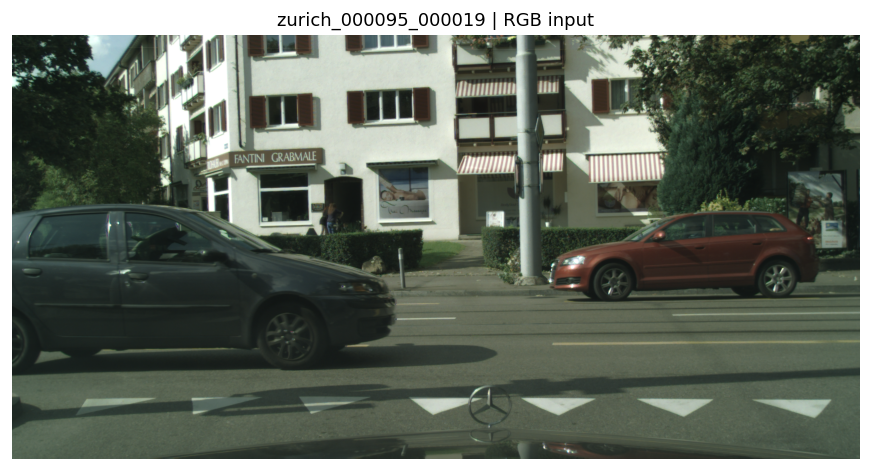

In [9]:
show_samples(
    lambda sample: sample["rgb"],
    lambda sample: f"{sample['stem']} | RGB input",
    figsize_per_sample=(9, 4),
)

## 1.2 DepthPro depth map

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/002_zurich_000095_000019_depthpro_depth.png


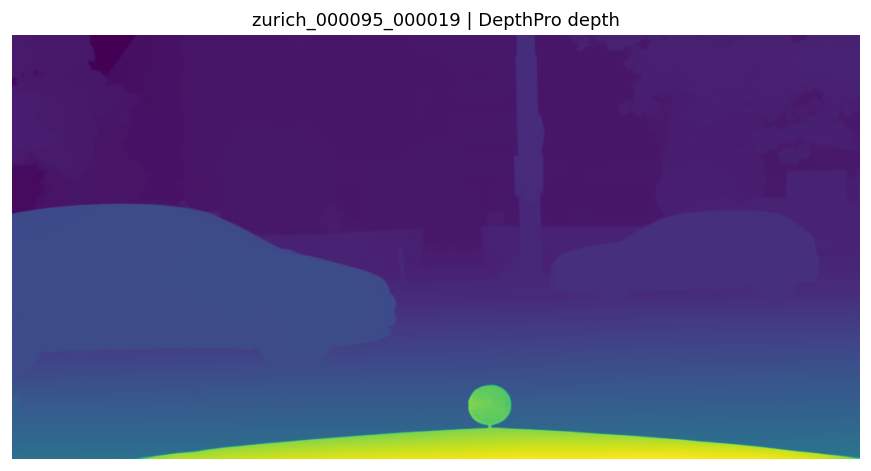

In [10]:
show_samples(
    lambda sample: sample["depth"],
    lambda sample: f"{sample['stem']} | DepthPro depth",
    cmap="viridis",
    figsize_per_sample=(9, 4),
)

## 1.3 DCFA sinusoidal depth encoding

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/003_zurich_000095_000019_16_channel_sinusoidal_depth_encoding_used_by_dcfa.png


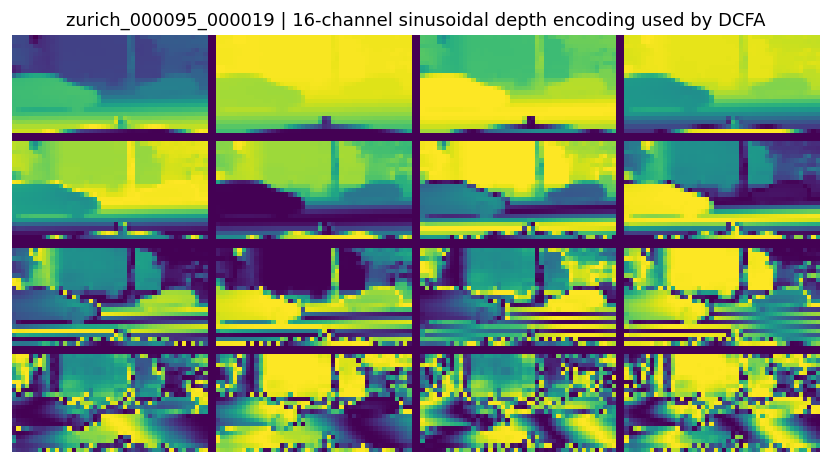

In [11]:
show_samples(
    lambda sample: channel_contact_sheet(dcfa_depth_encoding(sample), ncols=4),
    lambda sample: f"{sample['stem']} | 16-channel sinusoidal depth encoding used by DCFA",
    cmap="viridis",
    figsize_per_sample=(7, 4),
)

## 1.4 Frozen CAUSE-TR code cache

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/004_zurich_000095_000019_cause_tr_feature_norm_before_dcfa.png


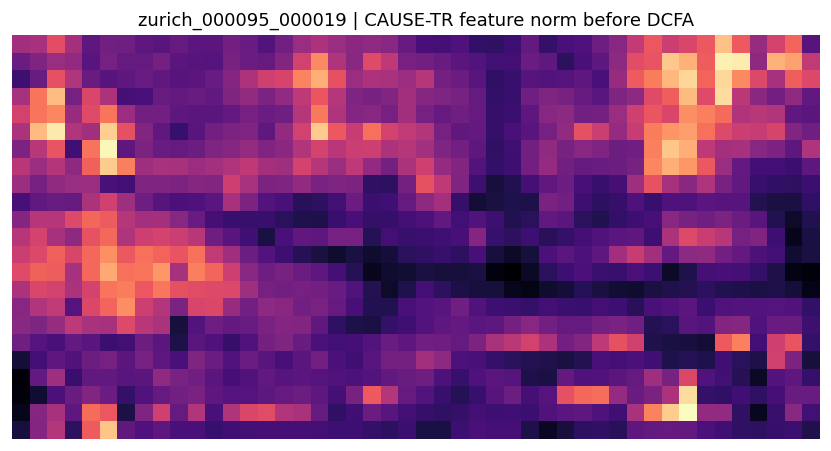

In [12]:
def cause_norm(sample):
    codes = sample["cause_codes"]
    if codes is None:
        return None
    if codes.ndim == 3:
        return np.linalg.norm(codes, axis=-1)
    if codes.ndim == 2:
        h = int(math.sqrt(codes.shape[0]))
        return np.linalg.norm(codes, axis=-1).reshape(h, -1)
    return None

show_samples(
    cause_norm,
    lambda sample: f"{sample['stem']} | CAUSE-TR feature norm before DCFA",
    cmap="magma",
    figsize_per_sample=(7, 4),
)

## 1.5 Raw k=80 semantic clusters before DCFA

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/005_zurich_000095_000019_raw_cause_tr_k_80_semantic_clusters.png


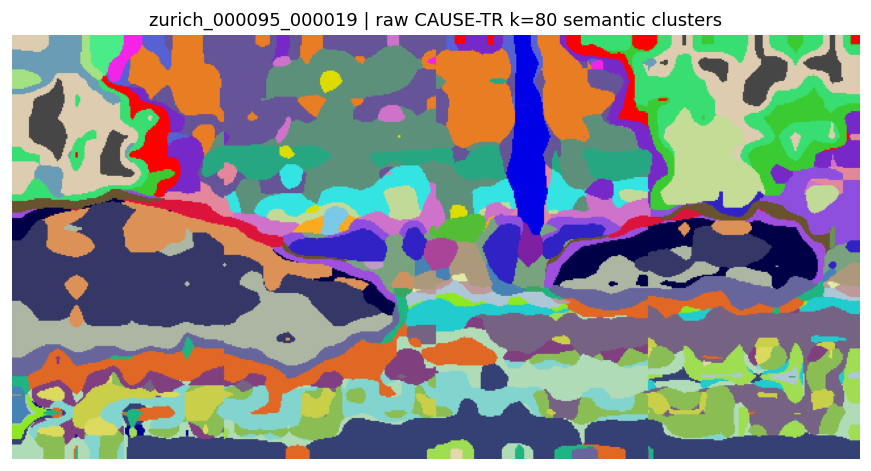

In [13]:
show_samples(
    lambda sample: sem_to_color(sample["raw_sem"]),
    lambda sample: f"{sample['stem']} | raw CAUSE-TR k=80 semantic clusters",
    figsize_per_sample=(9, 4),
)

## 1.6 Semantic features after DCFA adapter

Loaded DCFA adapter for visualization: depth_dim=16, hidden_dim=384, layers=2
saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/006_zurich_000095_000019_dcfa_adapted_semantic_feature_field_pca_rgb.png


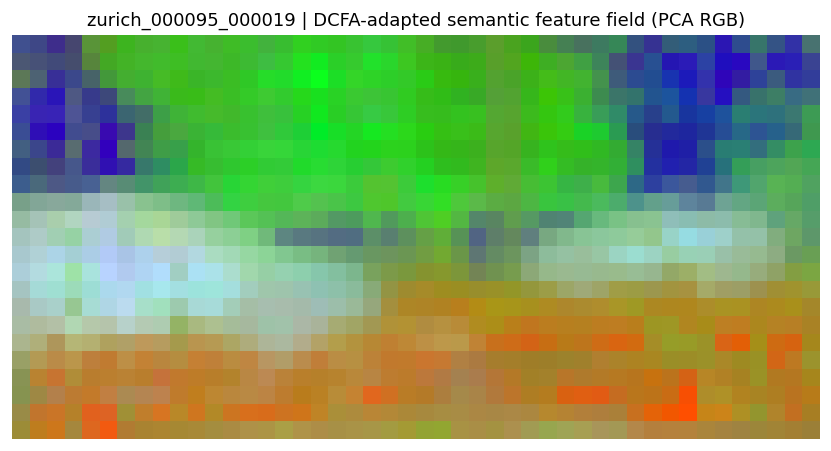

In [14]:
def dcfa_feature_rgb(sample):
    result = dcfa_features(sample)
    if result is None:
        return None
    return pca_rgb(result["adapted"])

show_samples(
    dcfa_feature_rgb,
    lambda sample: f"{sample['stem']} | DCFA-adapted semantic feature field (PCA RGB)",
    figsize_per_sample=(7, 4),
)

## 1.7 DCFA residual magnitude

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/007_zurich_000095_000019_magnitude_of_the_dcfa_residual_shift.png


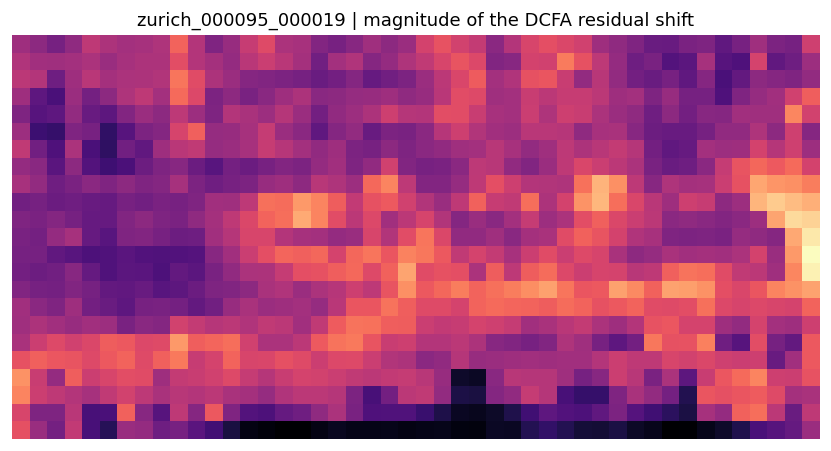

In [15]:
def dcfa_residual_norm(sample):
    result = dcfa_features(sample)
    if result is None:
        return None
    return np.linalg.norm(result["residual"], axis=-1)

show_samples(
    dcfa_residual_norm,
    lambda sample: f"{sample['stem']} | magnitude of the DCFA residual shift",
    cmap="magma",
    figsize_per_sample=(7, 4),
)

## 1.8 DCFA-adapted k=80 semantic clusters

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/008_zurich_000095_000019_dcfa_adapted_k_80_semantic_clusters.png


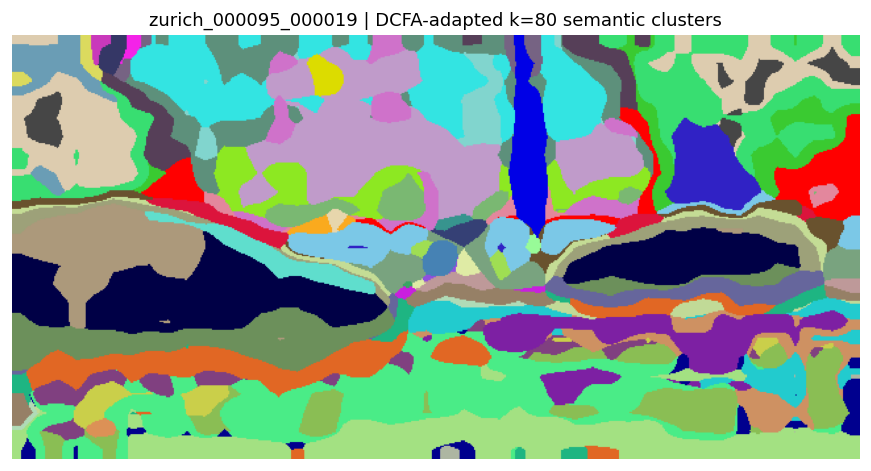

In [16]:
show_samples(
    lambda sample: sem_to_color(sample["dcfa_sem"]),
    lambda sample: f"{sample['stem']} | DCFA-adapted k=80 semantic clusters",
    figsize_per_sample=(9, 4),
)

## 1.9 Sobel gradient on DepthPro depth

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/009_zurich_000095_000019_sobel_depth_gradient_magnitude.png


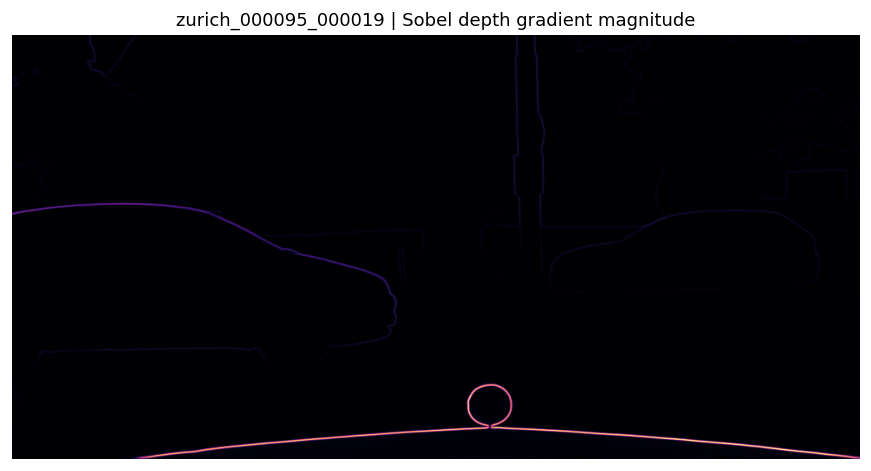

In [17]:
def depth_gradient(sample):
    depth = sample["depth"]
    if depth is None:
        return None
    gx = sobel(depth, axis=1)
    gy = sobel(depth, axis=0)
    return np.sqrt(gx ** 2 + gy ** 2)

show_samples(
    depth_gradient,
    lambda sample: f"{sample['stem']} | Sobel depth gradient magnitude",
    cmap="magma",
    figsize_per_sample=(9, 4),
)

## 1.10 Thresholded depth-boundary mask

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/010_zurich_000095_000019_depth_boundaries_at_tau_0_2.png


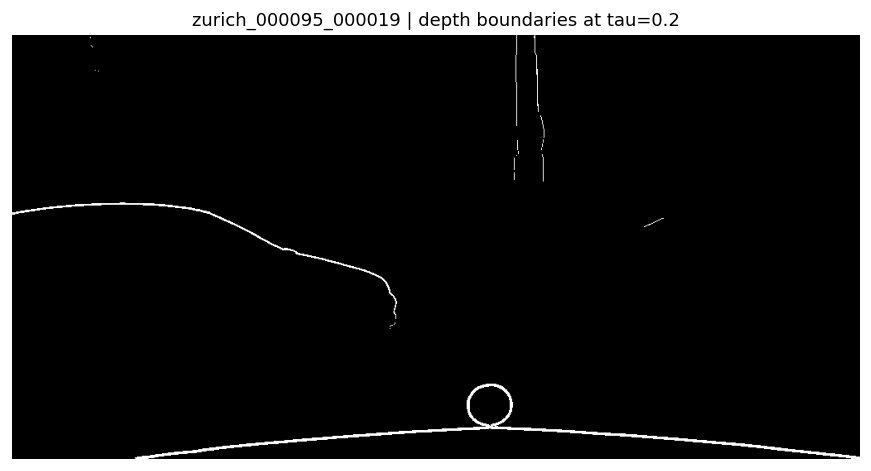

In [18]:
show_samples(
    lambda sample: depth_gradient(sample) > TAU_D if depth_gradient(sample) is not None else None,
    lambda sample: f"{sample['stem']} | depth boundaries at tau={TAU_D}",
    cmap="gray",
    figsize_per_sample=(9, 4),
)

## 1.11 Connected components inside thing-eligible regions

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/011_zurich_000095_000019_depth_connected_component_instances_used_before_simcf.png


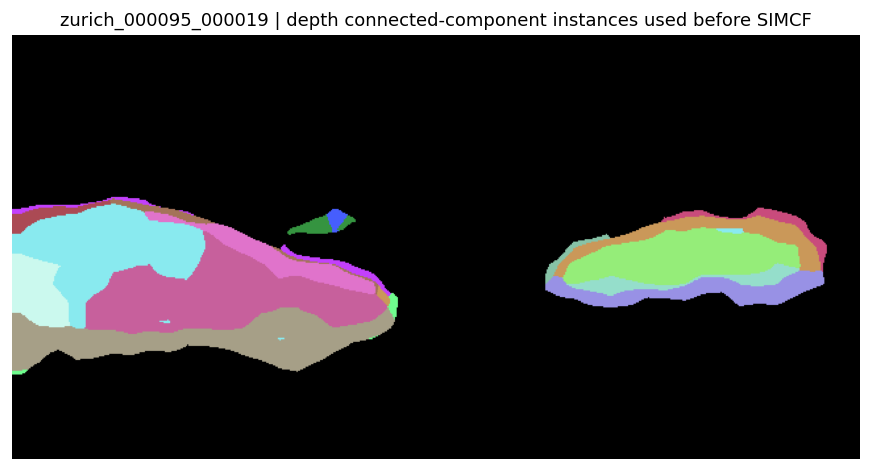

In [19]:
show_samples(
    lambda sample: inst_to_color(sample["depth_cc_inst"]),
    lambda sample: f"{sample['stem']} | depth connected-component instances used before SIMCF",
    figsize_per_sample=(9, 4),
)

## 1.12 Raw candidate semantic label before SIMCF

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/012_zurich_000095_000019_raw_semantic_candidate_before_simcf.png


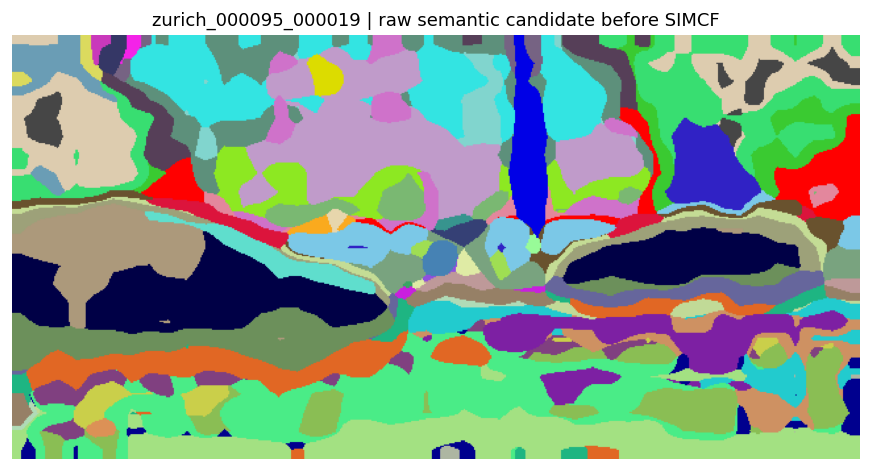

In [20]:
show_samples(
    lambda sample: sem_to_color(sample["raw_cups_sem"]),
    lambda sample: f"{sample['stem']} | raw semantic candidate before SIMCF",
    figsize_per_sample=(9, 4),
)

## 1.13 Raw candidate panoptic label before SIMCF

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/013_zurich_000095_000019_raw_panoptic_candidate_before_simcf.png


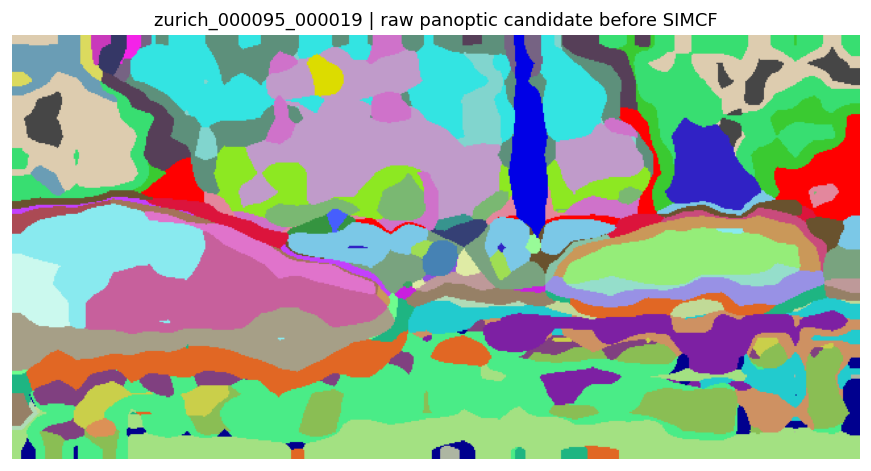

In [21]:
show_samples(
    lambda sample: panoptic_preview(sample["raw_cups_sem"], sample["raw_cups_inst"]),
    lambda sample: f"{sample['stem']} | raw panoptic candidate before SIMCF",
    figsize_per_sample=(9, 4),
)

## 1.14 SIMCF semantic revisions

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/014_zurich_000095_000019_pixels_whose_semantic_label_changed_in_simcf.png


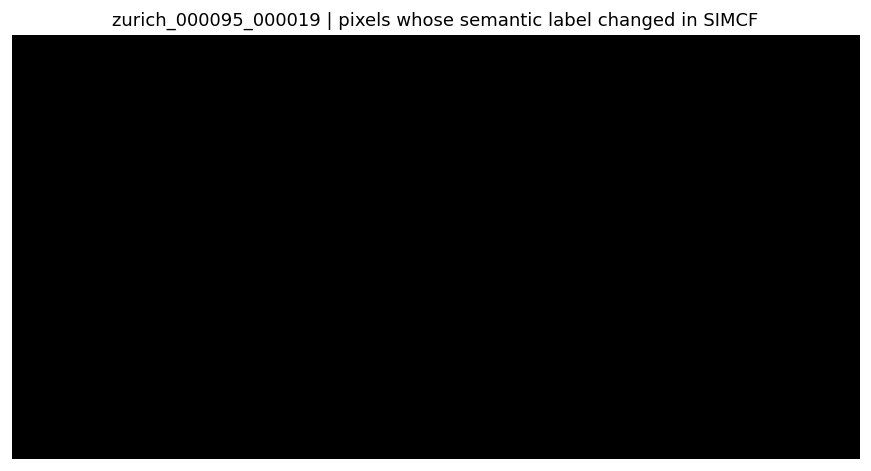

In [22]:
show_samples(
    lambda sample: (sample["raw_cups_sem"] != sample["final_sem"]) if sample["raw_cups_sem"] is not None and sample["final_sem"] is not None else None,
    lambda sample: f"{sample['stem']} | pixels whose semantic label changed in SIMCF",
    cmap="gray",
    figsize_per_sample=(9, 4),
)

## 1.15 SIMCF instance revisions and merges

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/015_zurich_000095_000019_pixels_whose_instance_label_changed_in_simcf.png


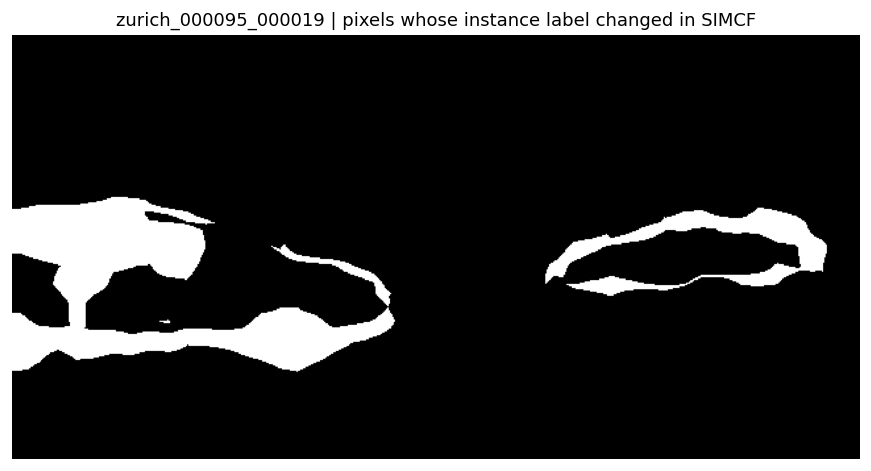

In [23]:
show_samples(
    lambda sample: (sample["raw_cups_inst"] != sample["final_inst"]) if sample["raw_cups_inst"] is not None and sample["final_inst"] is not None else None,
    lambda sample: f"{sample['stem']} | pixels whose instance label changed in SIMCF",
    cmap="gray",
    figsize_per_sample=(9, 4),
)

## 1.16 SIMCF final semantic label

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/016_zurich_000095_000019_final_simcf_semantic_label.png


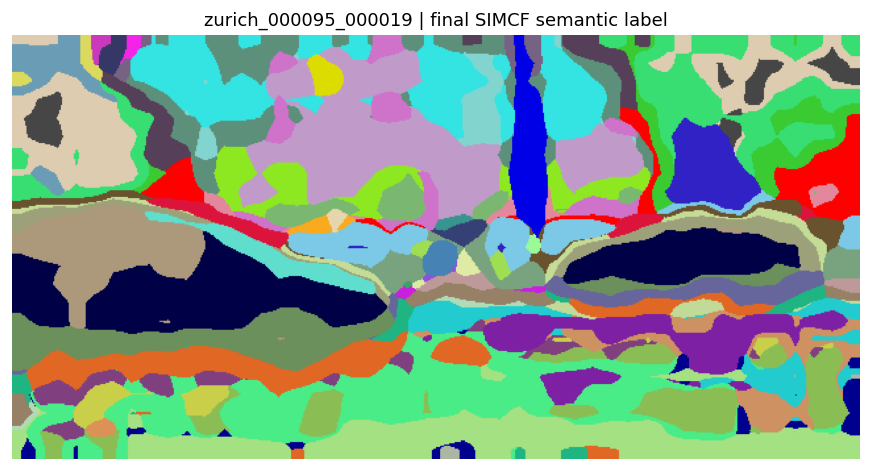

In [24]:
show_samples(
    lambda sample: sem_to_color(sample["final_sem"]),
    lambda sample: f"{sample['stem']} | final SIMCF semantic label",
    figsize_per_sample=(9, 4),
)

## 1.17 SIMCF final instance label

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/017_zurich_000095_000019_final_simcf_instance_label.png


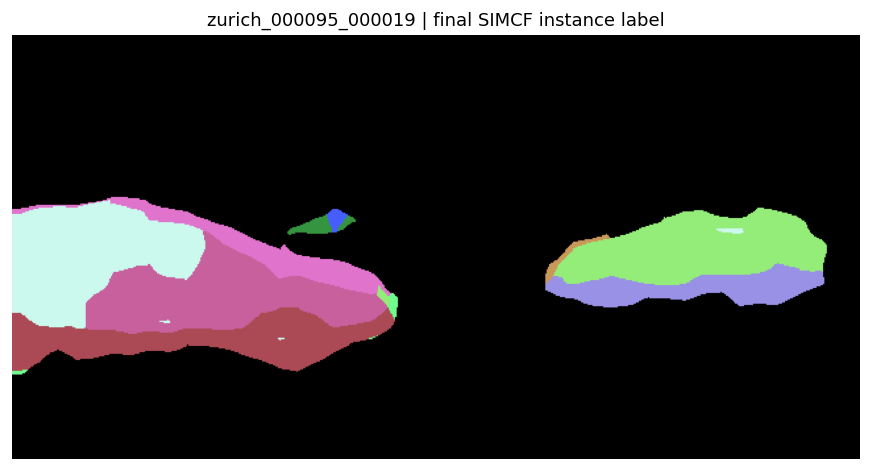

In [25]:
show_samples(
    lambda sample: inst_to_color(sample["final_inst"]),
    lambda sample: f"{sample['stem']} | final SIMCF instance label",
    figsize_per_sample=(9, 4),
)

## 1.18 Final panoptic pseudo-label

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/018_zurich_000095_000019_final_panoptic_pseudo_label.png


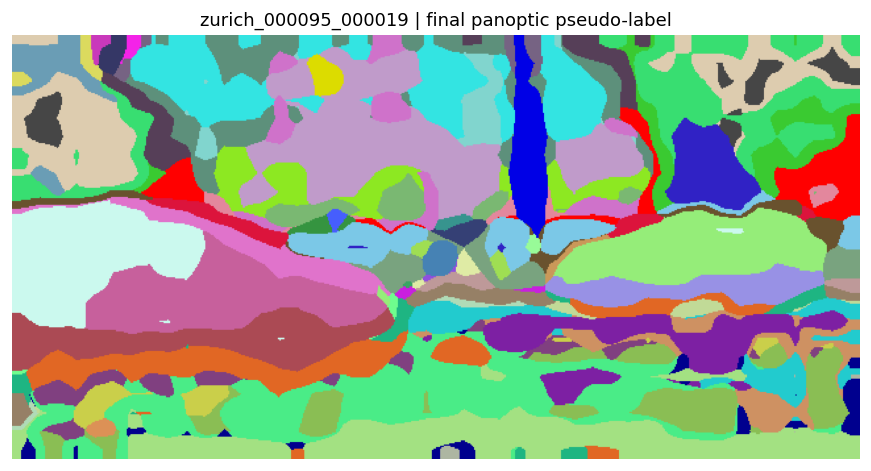

In [26]:
show_samples(
    lambda sample: panoptic_preview(sample["final_sem"], sample["final_inst"]),
    lambda sample: f"{sample['stem']} | final panoptic pseudo-label",
    figsize_per_sample=(9, 4),
)

# 2. Stage-2 panoptic bootstrapping

## 2.1 Build the Stage-2 training batch from filtered pseudo-labels

In [27]:
def make_training_batch(samples):
    images, depths, sems, insts = [], [], [], []
    for sample in samples:
        rgb = sample["rgb"].astype(np.float32) / 255.0
        depth_uint8 = (normalize01(sample["depth"]) * 255).astype(np.uint8)
        depth = resize_nearest(depth_uint8, rgb.shape[:2]).astype(np.float32) / 255.0
        sem_tok = token_downsample(sample["final_sem"].astype(np.int32)).reshape(-1).astype(np.int32)
        inst_tok = token_downsample(sample["final_inst"].astype(np.int32)).reshape(-1).astype(np.int32)
        images.append(rgb)
        depths.append(depth)
        sems.append(sem_tok)
        insts.append(inst_tok)
    return {
        "image": np.stack(images, axis=0),
        "depth": np.stack(depths, axis=0),
        "pseudo_semantic": np.stack(sems, axis=0),
        "pseudo_instance": np.stack(insts, axis=0),
    }

stage2_batch = make_training_batch(SAMPLES)
for key, value in stage2_batch.items():
    print(key, value.shape, value.dtype)

image (1, 1024, 2048, 3) float32
depth (1, 1024, 2048) float32
pseudo_semantic (1, 8192) int32
pseudo_instance (1, 8192) int32


## 2.2 Stage-2 clean RGB input

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/019_zurich_000095_000019_stage_2_rgb_input_before_augmentation.png


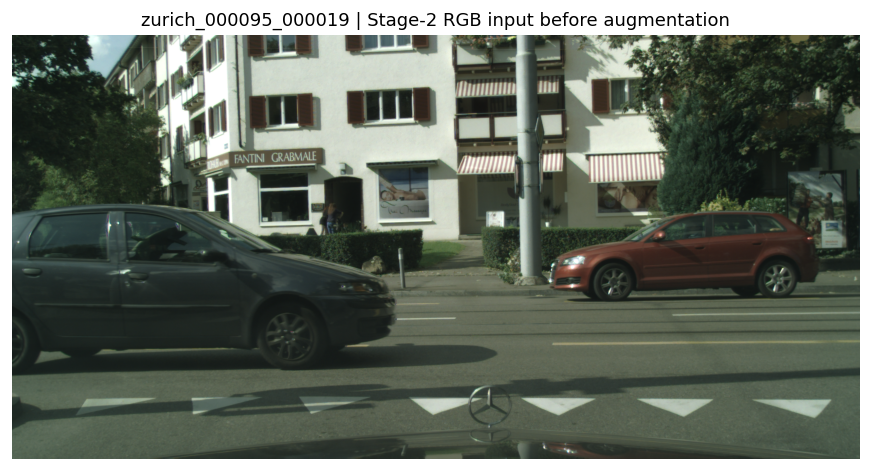

In [28]:
show_samples(
    lambda sample: sample["rgb"],
    lambda sample: f"{sample['stem']} | Stage-2 RGB input before augmentation",
    figsize_per_sample=(9, 4),
)

## 2.3 Stage-2 clean pseudo-label supervision

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/020_zurich_000095_000019_stage_2_supervision_before_augmentation.png


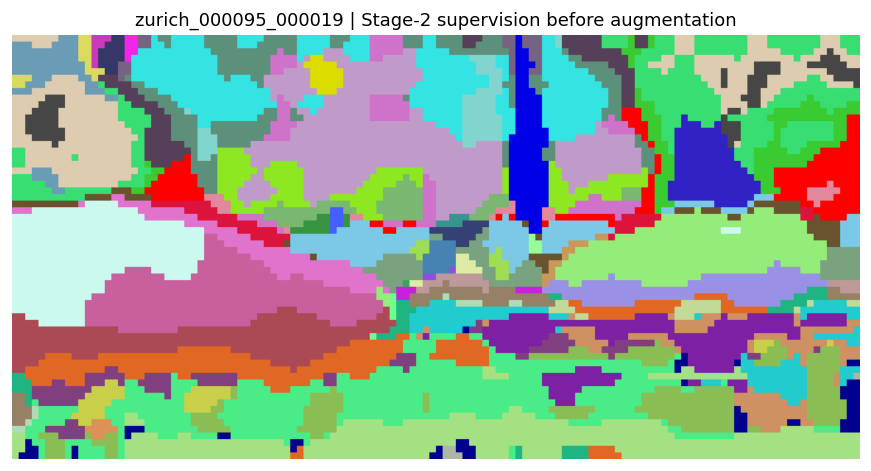

In [29]:
def stage2_clean_panoptic(sample):
    idx = sample_idx(sample)
    h, w = sample["rgb"].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    sem = token_upsample(stage2_batch["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    inst = token_upsample(stage2_batch["pseudo_instance"][idx].reshape(hp, wp), (h, w))
    return panoptic_preview(sem, inst)

show_samples(
    stage2_clean_panoptic,
    lambda sample: f"{sample['stem']} | Stage-2 supervision before augmentation",
    figsize_per_sample=(9, 4),
)

## 2.4 Stage-2 base resize and center crop

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/021_stage_2_dataset_preprocessing_scale_to_640x1280_and_center_crop_labels_with_the_image.png


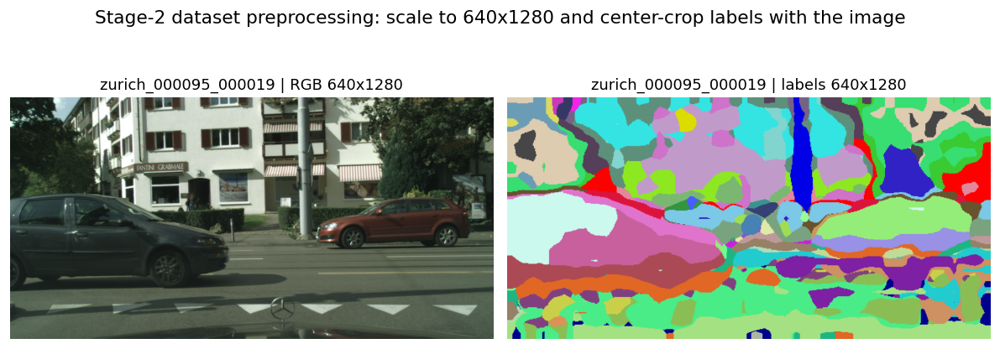

In [30]:
stage2_raw_states = [full_state_from_sample(sample) for sample in SAMPLES]
stage2_resized_states = [resize_vis_state(state, STAGE2_BASE_HW) for state in stage2_raw_states]
stage2_center_crop_states = [center_crop_vis_state(state, STAGE2_BASE_HW) for state in stage2_resized_states]

show_state_pairs(
    stage2_center_crop_states,
    "Stage-2 dataset preprocessing: scale to 640x1280 and center-crop labels with the image",
)

## 2.5 Stage-2 random horizontal flip

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/022_stage_2_spatial_augmentation_random_horizontal_flip_applied_jointly_to_rgb_and_labels.png


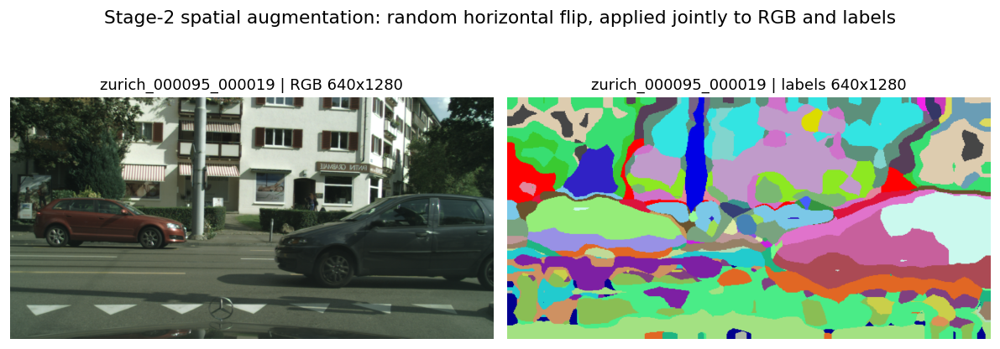

In [31]:
stage2_flip_states = [horizontal_flip_vis_state(state) for state in stage2_center_crop_states]

show_state_pairs(
    stage2_flip_states,
    "Stage-2 spatial augmentation: random horizontal flip, applied jointly to RGB and labels",
)

## 2.6 Stage-2 random resized crop

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/023_stage_2_spatial_augmentation_random_resized_crop_applied_jointly_to_rgb_and_labels.png


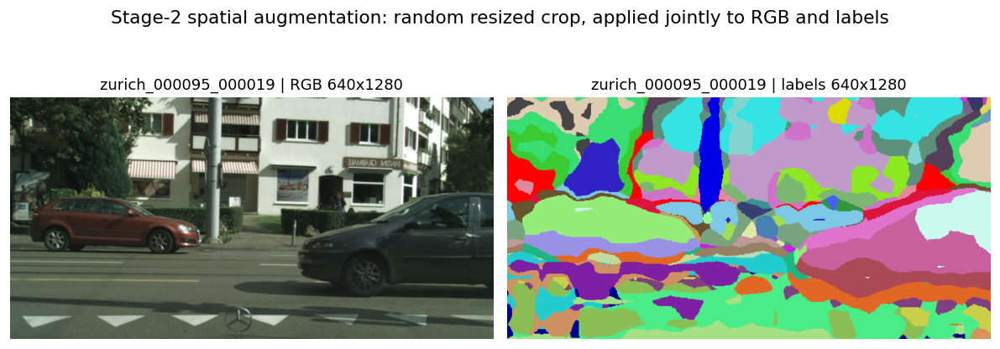

In [32]:
stage2_rrc_states = [
    random_resized_crop_vis_state(state, out_hw=STAGE2_BASE_HW, scale_range=(0.7, 1.0), seed=RNG_SEED + i)
    for i, state in enumerate(stage2_flip_states)
]

show_state_pairs(
    stage2_rrc_states,
    "Stage-2 spatial augmentation: random resized crop, applied jointly to RGB and labels",
)

## 2.7 Build the Stage-2 spatially augmented batch

In [33]:
stage2_spatial_batch = make_training_batch_from_states(stage2_rrc_states)
for key, value in stage2_spatial_batch.items():
    print(key, value.shape, value.dtype)

image (1, 640, 1280, 3) float32
depth (1, 640, 1280) float32
pseudo_semantic (1, 3200) int32
pseudo_instance (1, 3200) int32


## 2.8 Stage-2 pasteable instance source pool

zurich_000095_000019: 10 pasteable instances
saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/024_zurich_000095_000019_stage2_pasteable_instance_source_pool.png


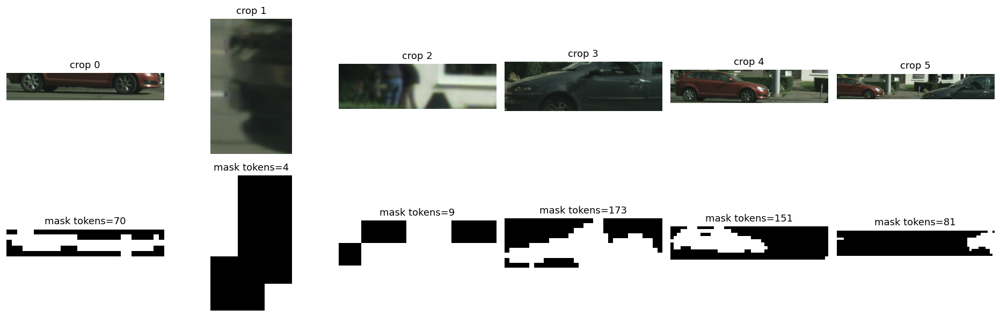

In [34]:
def show_paste_pool_for_sample(sample_index=0, max_instances=6):
    sample = SAMPLES[sample_index]
    if _extract_instances is None:
        print("_extract_instances unavailable; skipping paste pool visualization")
        return
    instances = _extract_instances(
        stage2_spatial_batch["pseudo_instance"][sample_index],
        stage2_spatial_batch["pseudo_semantic"][sample_index],
        stage2_spatial_batch["image"][sample_index],
        stage2_spatial_batch["depth"][sample_index],
        patch_size=PATCH_SIZE,
        min_tokens=4,
    )
    print(f"{sample['stem']}: {len(instances)} pasteable instances")
    n = min(len(instances), max_instances)
    if n == 0:
        return
    fig, axes = plt.subplots(2, n, figsize=(2.6 * n, 5))
    if n == 1:
        axes = np.array(axes).reshape(2, 1)
    for j in range(n):
        inst = instances[j]
        axes[0, j].imshow((inst["image"] * 255).astype(np.uint8))
        axes[0, j].set_title(f"crop {j}")
        axes[0, j].axis("off")
        axes[1, j].imshow(inst["mask"], cmap="gray")
        axes[1, j].set_title(f"mask tokens={int(inst['mask'].sum())}")
        axes[1, j].axis("off")
    plt.tight_layout()
    save_notebook_figure(fig, f"{sample['stem']} stage2 pasteable instance source pool")
    plt.show()

show_paste_pool_for_sample(sample_index=0)

## 2.9 Apply Stage-2 copy-paste augmentation

In [35]:
stage2_aug = copy_paste_augment(
    stage2_spatial_batch,
    rng=np.random.RandomState(RNG_SEED),
    patch_size=PATCH_SIZE,
    max_paste_objects=3,
    min_instance_tokens=4,
    flip_prob=0.5,
    scale_range=(0.25, 1.5),
)
print("Stage-2 copy-paste complete.")

Stage-2 copy-paste complete.


## 2.10 Stage-2 RGB after copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/025_zurich_000095_000019_stage_2_rgb_after_copy_paste.png


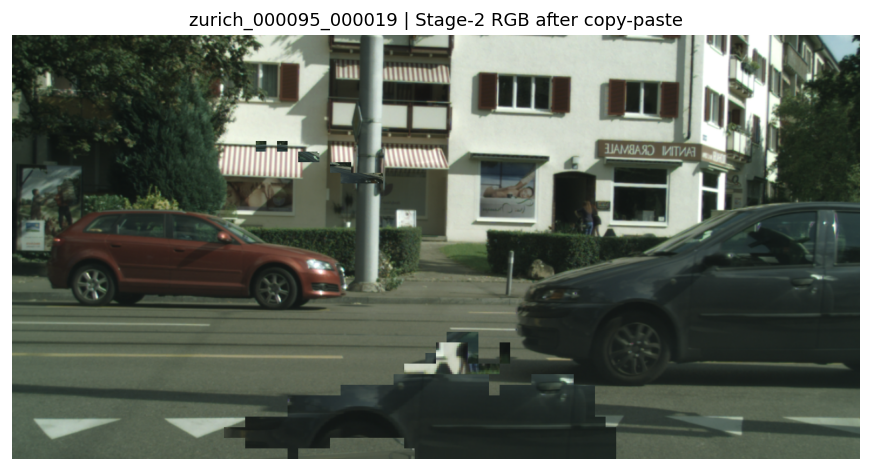

In [36]:
show_samples(
    lambda sample: (stage2_aug["image"][sample_idx(sample)] * 255).astype(np.uint8),
    lambda sample: f"{sample['stem']} | Stage-2 RGB after copy-paste",
    figsize_per_sample=(9, 4),
)

## 2.11 Stage-2 semantic label after copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/026_zurich_000095_000019_stage_2_semantic_after_copy_paste.png


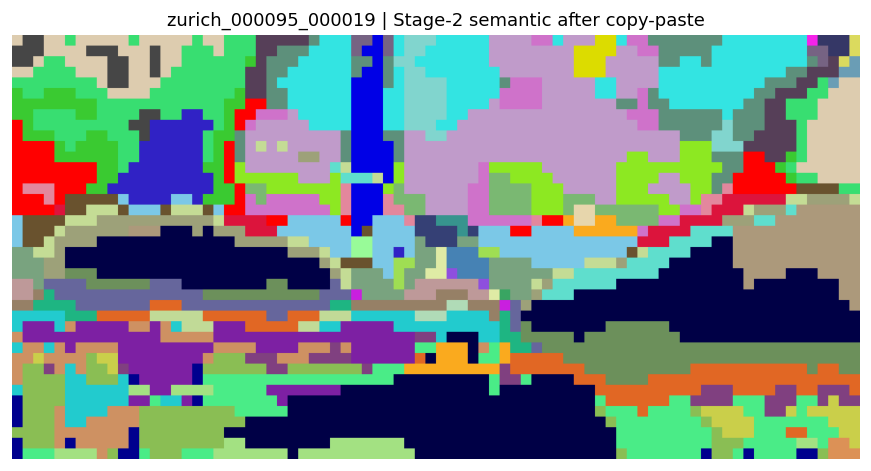

In [37]:
def stage2_aug_sem(sample):
    idx = sample_idx(sample)
    h, w = stage2_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    return sem_to_color(token_upsample(stage2_aug["pseudo_semantic"][idx].reshape(hp, wp), (h, w)))

show_samples(
    stage2_aug_sem,
    lambda sample: f"{sample['stem']} | Stage-2 semantic after copy-paste",
    figsize_per_sample=(9, 4),
)

## 2.12 Stage-2 instance label after copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/027_zurich_000095_000019_stage_2_instance_after_copy_paste.png


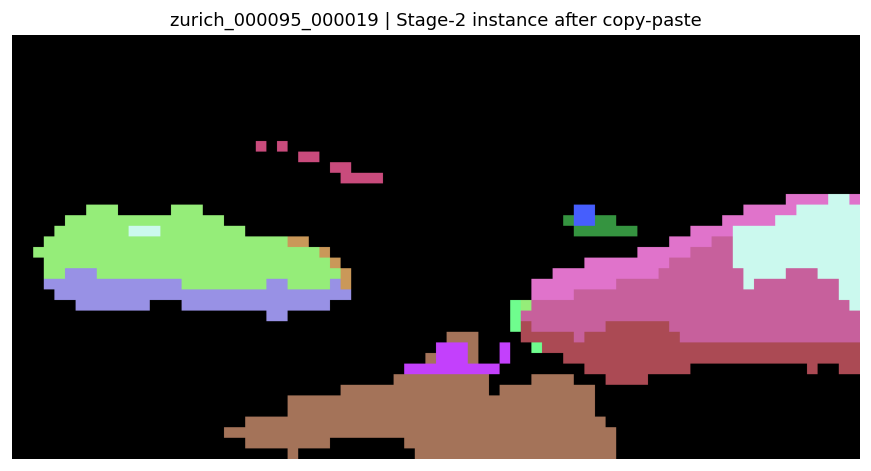

In [38]:
def stage2_aug_inst(sample):
    idx = sample_idx(sample)
    h, w = stage2_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    return inst_to_color(token_upsample(stage2_aug["pseudo_instance"][idx].reshape(hp, wp), (h, w)))

show_samples(
    stage2_aug_inst,
    lambda sample: f"{sample['stem']} | Stage-2 instance after copy-paste",
    figsize_per_sample=(9, 4),
)

## 2.13 Stage-2 copy-paste changed-pixel mask

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/028_zurich_000095_000019_pixels_changed_by_stage_2_copy_paste.png


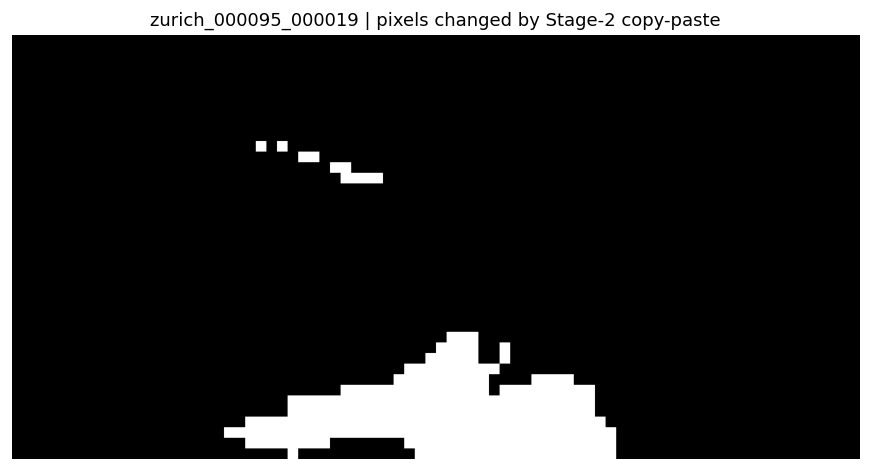

In [39]:
def stage2_changed(sample):
    idx = sample_idx(sample)
    h, w = stage2_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    before_sem = token_upsample(stage2_spatial_batch["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    before_inst = token_upsample(stage2_spatial_batch["pseudo_instance"][idx].reshape(hp, wp), (h, w))
    after_sem = token_upsample(stage2_aug["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    after_inst = token_upsample(stage2_aug["pseudo_instance"][idx].reshape(hp, wp), (h, w))
    return (before_sem != after_sem) | (before_inst != after_inst)

show_samples(
    stage2_changed,
    lambda sample: f"{sample['stem']} | pixels changed by Stage-2 copy-paste",
    cmap="gray",
    figsize_per_sample=(9, 4),
)

## 2.14 Stage-2 resolution jitter

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/029_stage_2_resolution_jitter_resize_rgb_and_labels_to_448x896.png


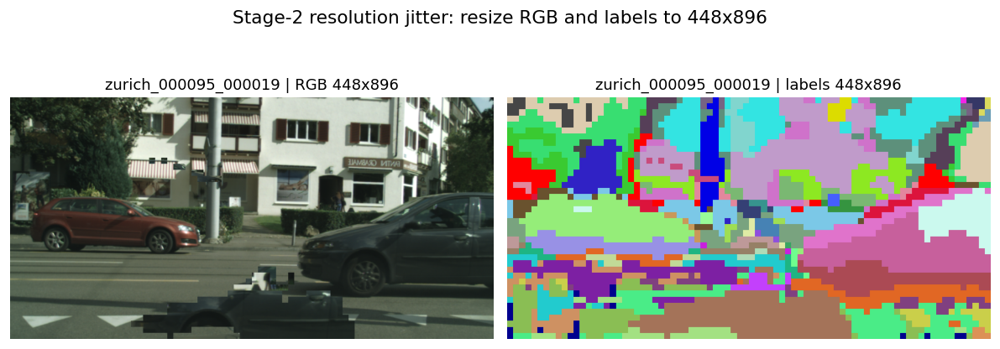

In [40]:
stage2_after_copy_paste_states = [batch_to_vis_state(stage2_aug, sample) for sample in SAMPLES]
stage2_jitter_hw = STAGE2_JITTER_HWS[2]
stage2_jitter_states = [resize_vis_state(state, stage2_jitter_hw) for state in stage2_after_copy_paste_states]

show_state_pairs(
    stage2_jitter_states,
    f"Stage-2 resolution jitter: resize RGB and labels to {stage2_jitter_hw[0]}x{stage2_jitter_hw[1]}",
)

## 2.15 Stage-2 photometric augmentation

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/030_stage_2_photometric_augmentation_blur_color_jitter_and_occasional_grayscale_on_rgb_only.png


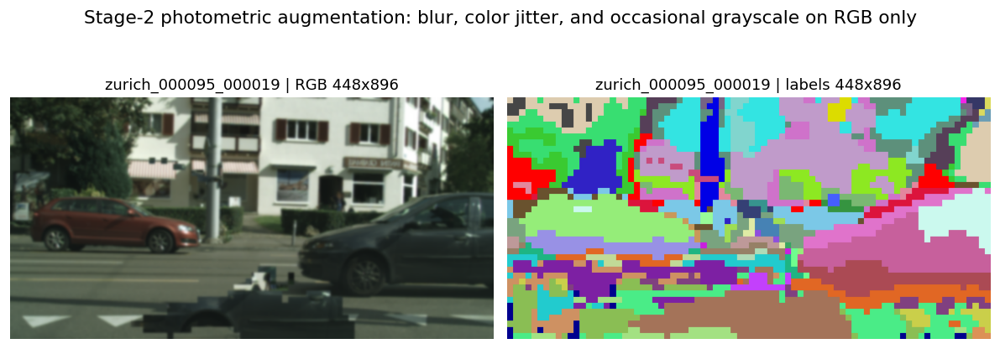

In [41]:
stage2_photometric_states = [
    photometric_vis_state(state, seed=RNG_SEED + 100 + i)
    for i, state in enumerate(stage2_jitter_states)
]

show_state_pairs(
    stage2_photometric_states,
    "Stage-2 photometric augmentation: blur, color jitter, and occasional grayscale on RGB only",
)

## 2.16 Stage-2 final augmented training pair

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/031_stage_2_final_training_pair_augmented_rgb_with_the_same_augmented_pseudo_label_geometry.png


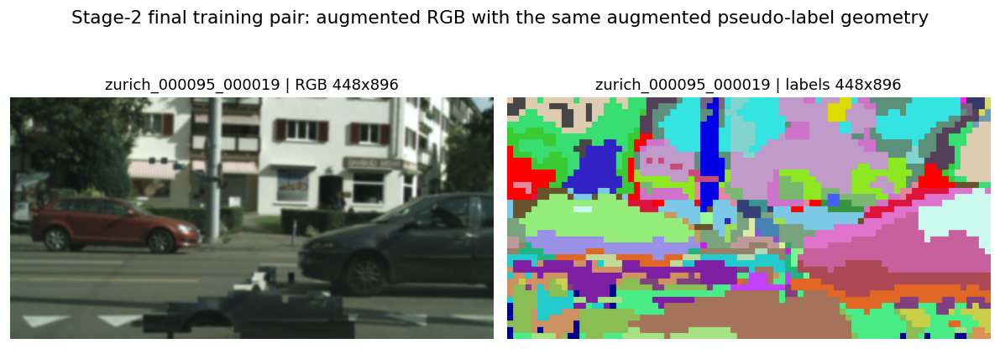

In [42]:
show_state_pairs(
    stage2_photometric_states,
    "Stage-2 final training pair: augmented RGB with the same augmented pseudo-label geometry",
)

## 2.17 Stage-2 void mask used by DropLoss

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/032_zurich_000095_000019_void_pixels_masked_by_droploss.png


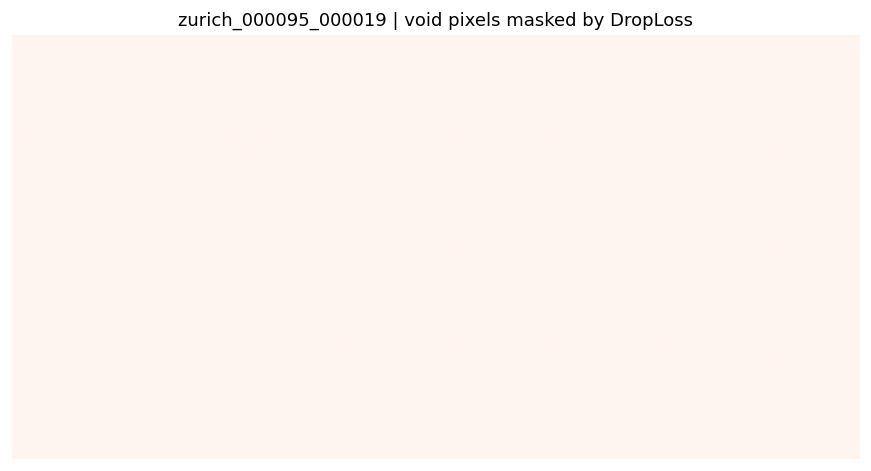

In [43]:
def stage2_void(sample):
    idx = sample_idx(sample)
    h, w = stage2_spatial_batch["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    sem = token_upsample(stage2_spatial_batch["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    return sem == 255

show_samples(
    stage2_void,
    lambda sample: f"{sample['stem']} | void pixels masked by DropLoss",
    cmap="Reds",
    figsize_per_sample=(9, 4),
)

## 2.18 Raw Stage-2 detector output overlaid on RGB

Experiment config file /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/refs/cups/configs/train_cityscapes_dinov3_vitb_dcfa_simcf_abc_santosh.yaml loaded.
Command line arguments loaded.


stage2: running detector on zurich_000095_000019 and caching the raw prediction...


Checkpoint loaded from /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/checkpoints/dinov3_vitb_depthpro_tau020_stage2/best_pq_28.40_step2821.ckpt.
Using DINOv3 ViT-B/16 backbone
Building PanopticFPN with ResNet backbone (temporary)...
Replacing backbone with DINOv3 ViT-B/16 (facebook/dinov3-vitb16-pretrain-lvd1689m)...
DINOv3 ViT-B/16 backbone: 91.2M params (frozen=True)
Total: 137.8M params, trainable: 52.2M params
/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/.venv/lib/python3.14/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:4383.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W0430 15:32:30.751000 3735 .venv/lib/python3.14/site-packages/torch/fx/_symbolic_trace.py:53] is_fx_tracing will return true for both fx.symb

Saved stage2 raw output cache to /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/results/stage2_visualization_cache
stage2 output for zurich_000095_000019: zurich_000095_000019_semantic.png + zurich_000095_000019_instance.png
saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/033_raw_stage_2_panoptic_bootstrapping_output_prediction_and_rgb_overlay.png


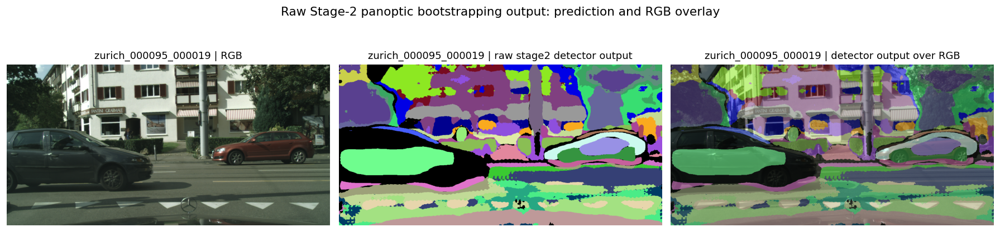

In [44]:
show_stage_output_overlay(
    "stage2",
    "Raw Stage-2 panoptic bootstrapping output: prediction and RGB overlay",
)

# 3. Stage-3 panoptic network training

## 3.1 Load EMA-teacher prediction source or fallback source

In [45]:
STAGE3_TEACHER_DIRS = [
    PROJECT_ROOT / "results/stage3_visualization_cache",
    CITYSCAPES_ROOT / "stage3_teacher_predictions",
]

def load_teacher_or_fallback(sample):
    base = sample["stem"]
    for root in STAGE3_TEACHER_DIRS:
        sem_path = root / f"{base}_semantic.png"
        inst_path = root / f"{base}_instance.png"
        conf_path = root / f"{base}_confidence.npy"
        if sem_path.exists() and inst_path.exists():
            sem = read_image(sem_path).astype(np.int32)
            inst = read_image(inst_path).astype(np.int32)
            conf = read_npy(conf_path) if conf_path.exists() else np.ones_like(sem, dtype=np.float32)
            return sem, inst, normalize01(conf), f"teacher cache: {root}"
    sem = sample["final_sem"].astype(np.int32)
    inst = sample["final_inst"].astype(np.int32)
    conf = np.where(sem == 255, 0.0, 1.0).astype(np.float32)
    return sem, inst, conf, "fallback: filtered Stage-1 pseudo-labels"

teacher_semantics = []
teacher_instances = []
teacher_confidences = []
teacher_sources = []
for sample in SAMPLES:
    sem, inst, conf, source = load_teacher_or_fallback(sample)
    teacher_semantics.append(sem)
    teacher_instances.append(inst)
    teacher_confidences.append(conf)
    teacher_sources.append(source)
    print(sample["stem"], source)

zurich_000095_000019 teacher cache: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/results/stage3_visualization_cache


## 3.2 Stage-3 dataset preprocessing and teacher TTA views

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/034_zurich_000095_000019_grid.png


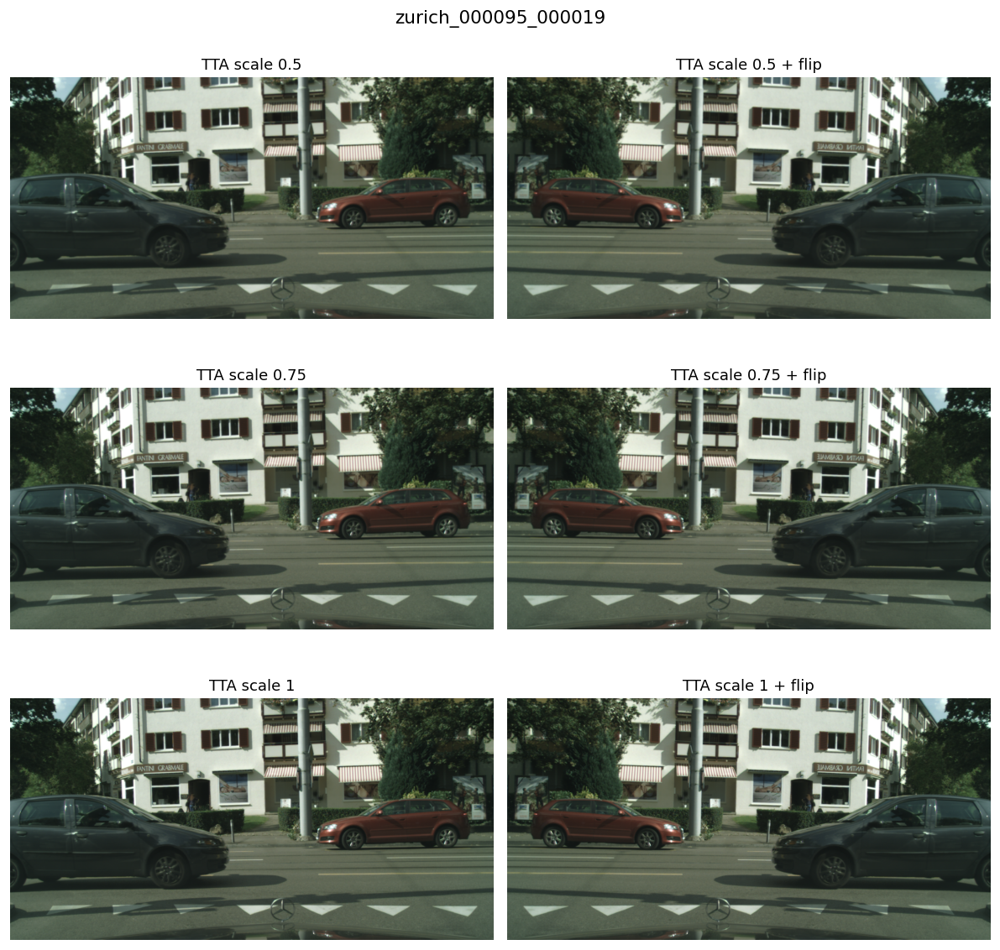

In [46]:
def teacher_state_from_sample(sample):
    idx = sample_idx(sample)
    rgb = sample["rgb"].astype(np.uint8)
    hw = rgb.shape[:2]
    return {
        "rgb": rgb,
        "depth": resize_float_arr(normalize01(sample["depth"]), hw) if sample["depth"] is not None else None,
        "sem": resize_label_arr(teacher_semantics[idx], hw),
        "inst": resize_label_arr(teacher_instances[idx], hw),
        "stem": sample["stem"],
    }

stage3_teacher_raw_states = [teacher_state_from_sample(sample) for sample in SAMPLES]
stage3_base_states = [
    center_crop_vis_state(resize_vis_state(state, STAGE2_BASE_HW), STAGE2_BASE_HW)
    for state in stage3_teacher_raw_states
]
stage3_base_batch = make_training_batch_from_states(stage3_base_states)

sample = SAMPLES[0]
base_rgb = stage3_base_states[0]["rgb"]
panels = []
for scale in STAGE3_TTA_SCALES:
    scaled_hw = (int(round(base_rgb.shape[0] * scale)), int(round(base_rgb.shape[1] * scale)))
    scaled = resize_rgb_arr(base_rgb, scaled_hw)
    panels.append((scaled, f"TTA scale {scale:g}", None))
    panels.append((scaled[:, ::-1], f"TTA scale {scale:g} + flip", None))
show_grid(sample, panels, ncols=2, figsize=(10, 10))

## 3.3 EMA-teacher semantic prediction

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/035_zurich_000095_000019_ema_teacher_semantic_source.png


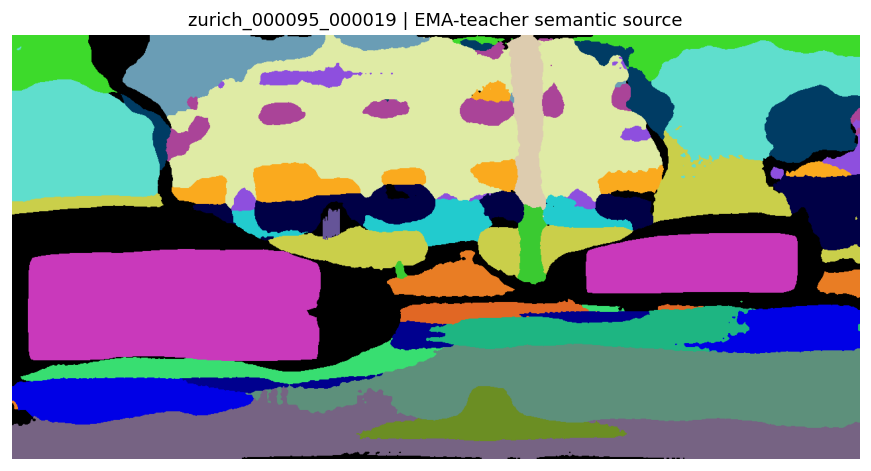

In [47]:
show_samples(
    lambda sample: sem_to_color(teacher_semantics[sample_idx(sample)]),
    lambda sample: f"{sample['stem']} | EMA-teacher semantic source",
    figsize_per_sample=(9, 4),
)

## 3.4 EMA-teacher instance prediction

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/036_zurich_000095_000019_ema_teacher_instance_source.png


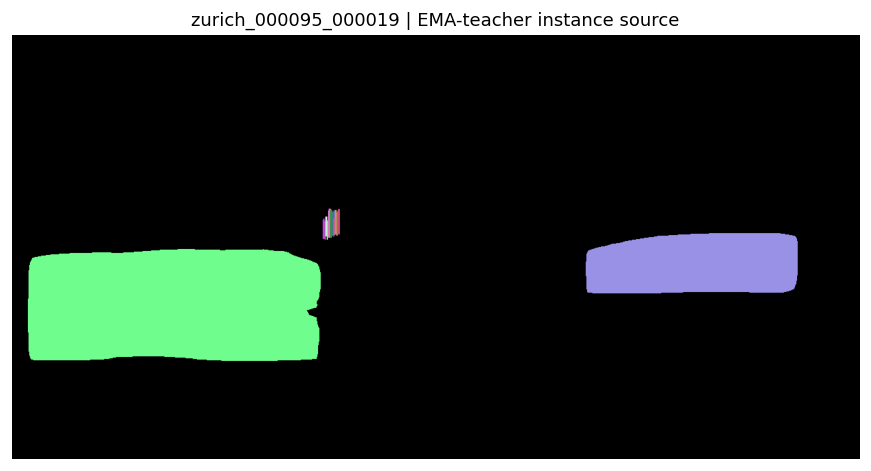

In [48]:
show_samples(
    lambda sample: inst_to_color(teacher_instances[sample_idx(sample)]),
    lambda sample: f"{sample['stem']} | EMA-teacher instance source",
    figsize_per_sample=(9, 4),
)

## 3.5 EMA confidence / threshold mask

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/037_zurich_000095_000019_ema_confidence_source_threshold_0_75.png


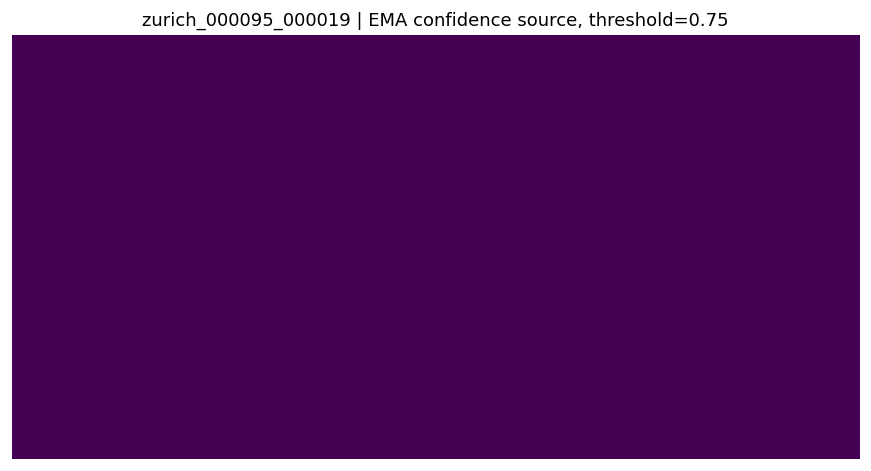

In [49]:
show_samples(
    lambda sample: teacher_confidences[sample_idx(sample)],
    lambda sample: f"{sample['stem']} | EMA confidence source, threshold=0.75",
    cmap="viridis",
    figsize_per_sample=(9, 4),
)

## 3.6 Build self-enhanced copy-paste source batch

In [50]:
teacher_sem_tok = []
teacher_inst_tok = []
teacher_conf_tok = []
for state, conf in zip(stage3_base_states, teacher_confidences):
    conf_resized = resize_float_arr(normalize01(conf), state["rgb"].shape[:2])
    teacher_sem_tok.append(token_downsample(state["sem"]).reshape(-1).astype(np.int32))
    teacher_inst_tok.append(token_downsample(state["inst"]).reshape(-1).astype(np.int32))
    teacher_conf_tok.append(token_downsample((normalize01(conf_resized) * 255).astype(np.uint8)).reshape(-1).astype(np.float32) / 255.0)

teacher_source_batch = create_self_enhanced_source(
    images=stage3_base_batch["image"],
    depths=stage3_base_batch["depth"],
    semantic_preds=np.stack(teacher_sem_tok, axis=0),
    instance_preds=np.stack(teacher_inst_tok, axis=0),
    confidence=np.stack(teacher_conf_tok, axis=0),
    confidence_threshold=0.75,
)
print("teacher_source_batch:", None if teacher_source_batch is None else {k: v.shape for k, v in teacher_source_batch.items()})

teacher_source_batch: None


## 3.7 Apply Stage-3 self-enhanced copy-paste

In [51]:
stage3_aug = copy_paste_augment(
    stage3_base_batch,
    rng=np.random.RandomState(RNG_SEED + 11),
    patch_size=PATCH_SIZE,
    max_paste_objects=3,
    min_instance_tokens=4,
    flip_prob=0.5,
    scale_range=(0.25, 1.5),
    source_batch=teacher_source_batch,
) if teacher_source_batch is not None else stage3_base_batch
print("Stage-3 self-enhanced copy-paste complete.")

Stage-3 self-enhanced copy-paste complete.


## 3.8 Stage-3 student RGB after self-enhanced copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/038_zurich_000095_000019_stage_3_student_rgb_after_self_enhanced_copy_paste.png


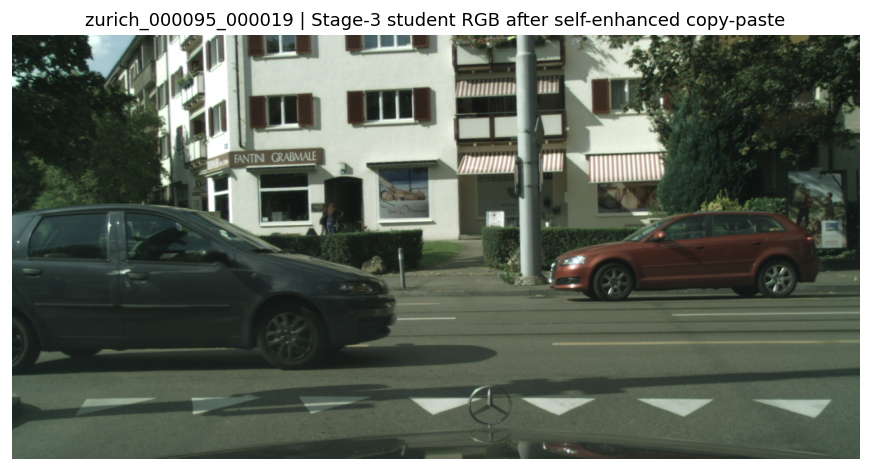

In [52]:
show_samples(
    lambda sample: (stage3_aug["image"][sample_idx(sample)] * 255).astype(np.uint8),
    lambda sample: f"{sample['stem']} | Stage-3 student RGB after self-enhanced copy-paste",
    figsize_per_sample=(9, 4),
)

## 3.9 Stage-3 semantic label after self-enhanced copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/039_zurich_000095_000019_stage_3_semantic_label_after_augmentation.png


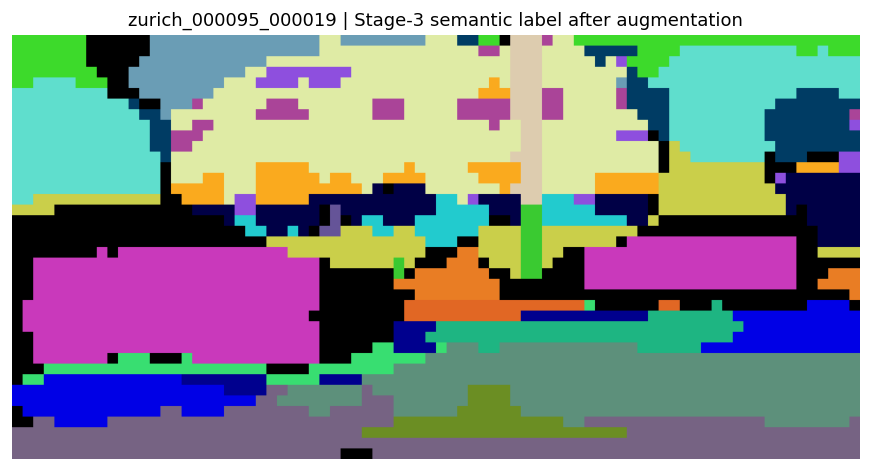

In [53]:
def stage3_aug_sem(sample):
    idx = sample_idx(sample)
    h, w = stage3_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    return sem_to_color(token_upsample(stage3_aug["pseudo_semantic"][idx].reshape(hp, wp), (h, w)))

show_samples(
    stage3_aug_sem,
    lambda sample: f"{sample['stem']} | Stage-3 semantic label after augmentation",
    figsize_per_sample=(9, 4),
)

## 3.10 Stage-3 instance label after self-enhanced copy-paste

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/040_zurich_000095_000019_stage_3_instance_label_after_augmentation.png


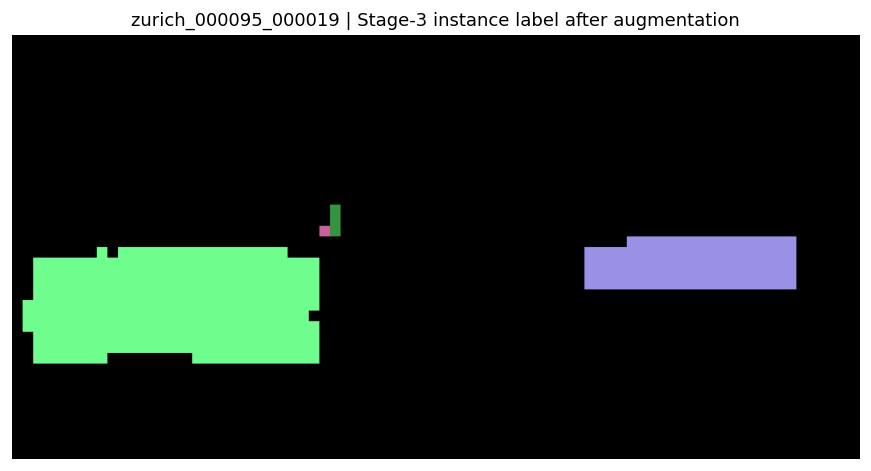

In [54]:
def stage3_aug_inst(sample):
    idx = sample_idx(sample)
    h, w = stage3_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    return inst_to_color(token_upsample(stage3_aug["pseudo_instance"][idx].reshape(hp, wp), (h, w)))

show_samples(
    stage3_aug_inst,
    lambda sample: f"{sample['stem']} | Stage-3 instance label after augmentation",
    figsize_per_sample=(9, 4),
)

## 3.11 Stage-3 changed-pixel mask

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/041_zurich_000095_000019_pixels_changed_by_stage_3_augmentation.png


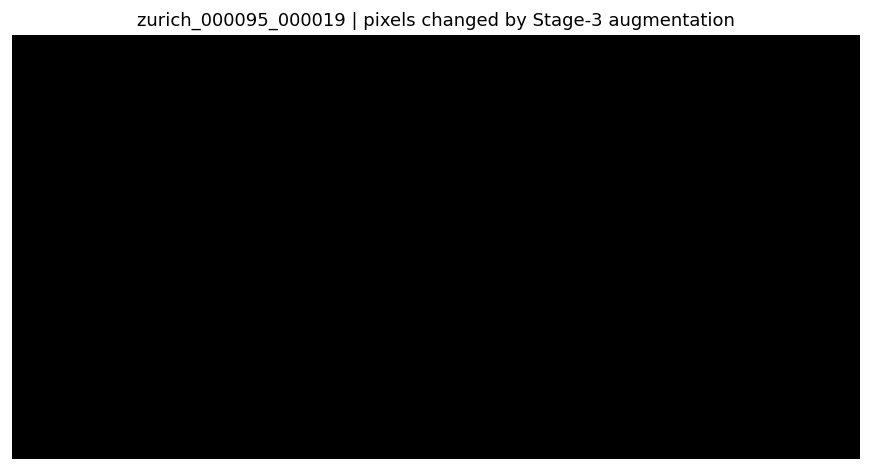

In [55]:
def stage3_changed(sample):
    idx = sample_idx(sample)
    h, w = stage3_aug["image"][idx].shape[:2]
    hp, wp = h // PATCH_SIZE, w // PATCH_SIZE
    before_sem = token_upsample(stage3_base_batch["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    before_inst = token_upsample(stage3_base_batch["pseudo_instance"][idx].reshape(hp, wp), (h, w))
    after_sem = token_upsample(stage3_aug["pseudo_semantic"][idx].reshape(hp, wp), (h, w))
    after_inst = token_upsample(stage3_aug["pseudo_instance"][idx].reshape(hp, wp), (h, w))
    return (before_sem != after_sem) | (before_inst != after_inst)

show_samples(
    stage3_changed,
    lambda sample: f"{sample['stem']} | pixels changed by Stage-3 augmentation",
    cmap="gray",
    figsize_per_sample=(9, 4),
)

## 3.12 Stage-3 photometric augmentation

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/042_stage_3_photometric_augmentation_blur_color_jitter_and_occasional_grayscale_on_rgb_only.png


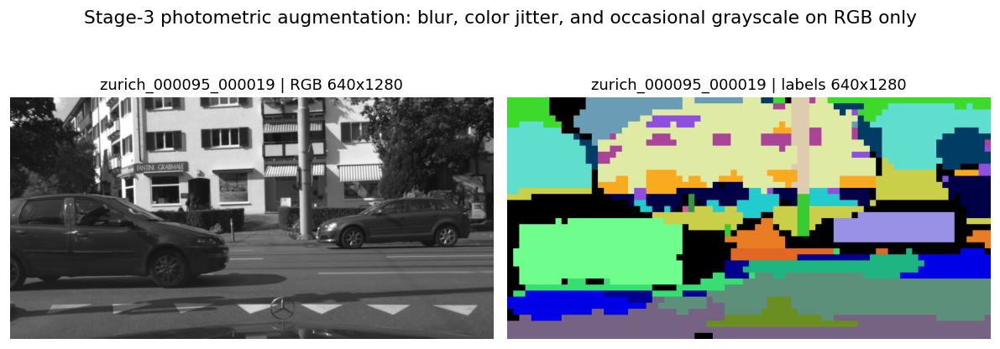

In [56]:
stage3_after_copy_paste_states = [batch_to_vis_state(stage3_aug, sample) for sample in SAMPLES]
stage3_photometric_states = [
    photometric_vis_state(state, seed=RNG_SEED + 300 + i)
    for i, state in enumerate(stage3_after_copy_paste_states)
]

show_state_pairs(
    stage3_photometric_states,
    "Stage-3 photometric augmentation: blur, color jitter, and occasional grayscale on RGB only",
)

## 3.13 Stage-3 random crop

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/043_zurich_000095_000019_grid.png


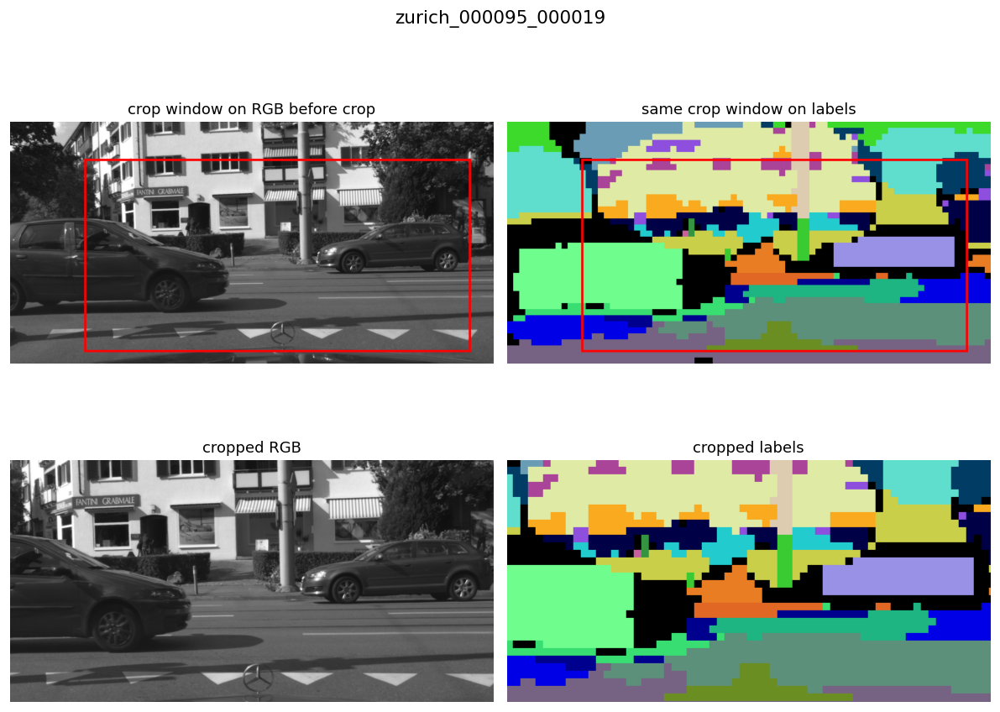

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/044_stage_3_random_crop_shown_with_a_visible_512x1024_crop_from_the_configured_512_1024_range.png


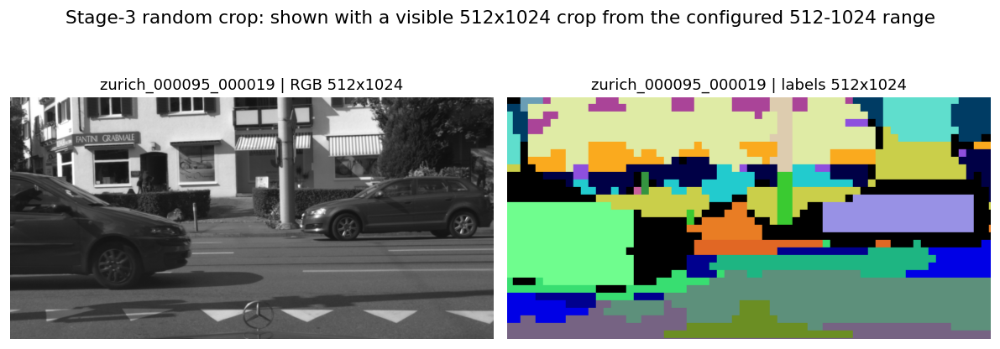

In [57]:
stage3_crop_states = [
    random_crop_vis_state(
        state,
        resolution_min=512,
        resolution_max=1024,
        long_side_scale=2.0,
        seed=RNG_SEED + 400 + i,
        forced_resolution=512,
    )
    for i, state in enumerate(stage3_photometric_states)
]

for before, cropped in zip(stage3_photometric_states, stage3_crop_states):
    crop_box = cropped["crop_box"]
    panels = [
        (draw_crop_box(before["rgb"], crop_box), "crop window on RGB before crop", None),
        (draw_crop_box(panoptic_preview(before["sem"], before["inst"]), crop_box), "same crop window on labels", None),
        (cropped["rgb"], "cropped RGB", None),
        (panoptic_preview(cropped["sem"], cropped["inst"]), "cropped labels", None),
    ]
    show_grid({"stem": before["stem"]}, panels, ncols=2, figsize=(10, 8))

show_state_pairs(
    stage3_crop_states,
    "Stage-3 random crop: shown with a visible 512x1024 crop from the configured 512-1024 range",
)

## 3.14 Stage-3 resolution jitter

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/045_stage_3_resolution_jitter_resize_rgb_and_labels_to_416x832.png


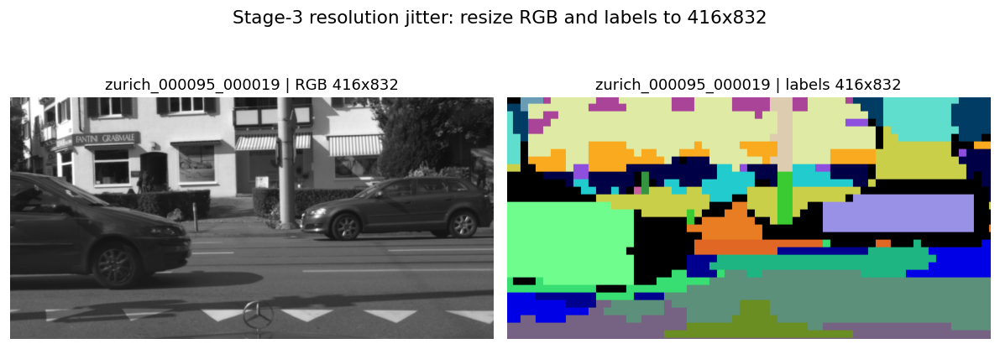

In [58]:
stage3_jitter_hw = STAGE3_JITTER_HWS[1]
stage3_jitter_states = [resize_vis_state(state, stage3_jitter_hw) for state in stage3_crop_states]

show_state_pairs(
    stage3_jitter_states,
    f"Stage-3 resolution jitter: resize RGB and labels to {stage3_jitter_hw[0]}x{stage3_jitter_hw[1]}",
)

## 3.15 Stage-3 final augmented training pair

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/046_stage_3_final_training_pair_self_enhanced_labels_after_copy_paste_photometric_augmentation.png


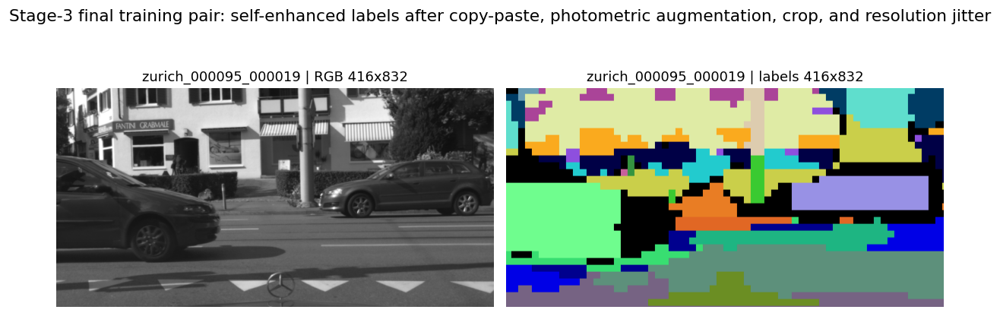

In [59]:
show_state_pairs(
    stage3_jitter_states,
    "Stage-3 final training pair: self-enhanced labels after copy-paste, photometric augmentation, crop, and resolution jitter",
)

## 3.16 Raw Stage-3 detector output overlaid on RGB

Experiment config file /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/refs/cups/configs/val_stage3_dcfa_simcf_abc_local.yaml loaded.
Command line arguments loaded.


stage3: running detector on zurich_000095_000019 and caching the raw prediction...


Self-training: Using DINOv3 ViT-B/16 backbone
Building PanopticFPN with ResNet backbone (temporary)...
Replacing backbone with DINOv3 ViT-B/16 (facebook/dinov3-vitb16-pretrain-lvd1689m)...
DINOv3 ViT-B/16 backbone: 91.2M params (frozen=True)
Total: 137.8M params, trainable: 52.2M params
Loading checkpoint into DINOv3 model: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/checkpoints/stage3_dcfa_simcf_abc/best_pq_step=003000.ckpt
Filtered 285 teacher keys from checkpoint
TTA model wrapped after checkpoint loading.
Freeze batch norm layers


Saved stage3 raw output cache to /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/results/stage3_visualization_cache
stage3 output for zurich_000095_000019: zurich_000095_000019_semantic.png + zurich_000095_000019_instance.png
saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/047_raw_stage_3_panoptic_network_output_prediction_and_rgb_overlay.png


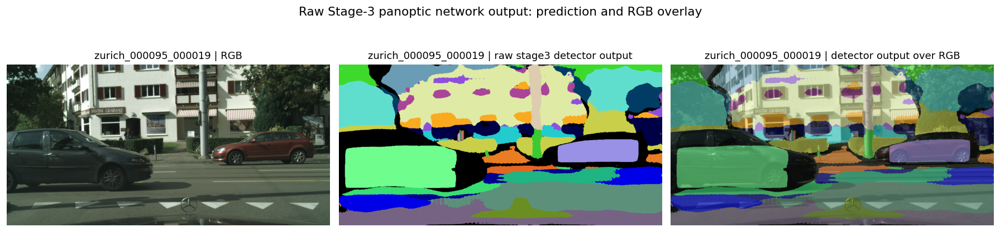

In [60]:
show_stage_output_overlay(
    "stage3",
    "Raw Stage-3 panoptic network output: prediction and RGB overlay",
)

# 4. Optional summary/export cells

## 4.1 Compact per-image trace for supplementary panels

saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/048_zurich_000095_000019_grid.png


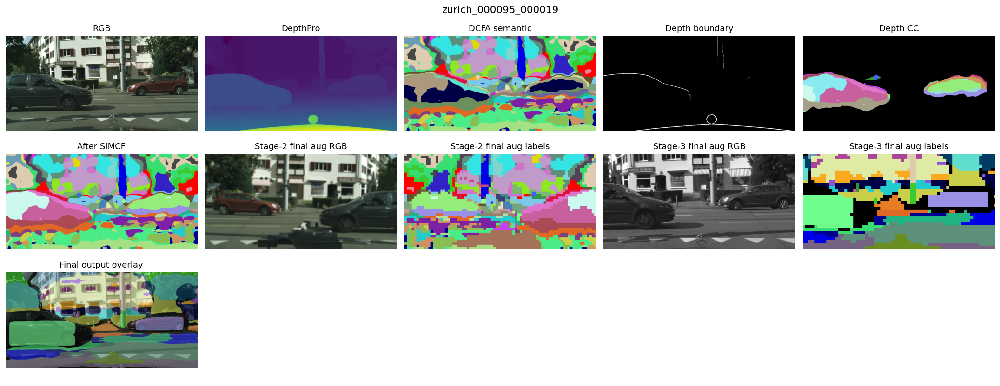

In [61]:
for sample in SAMPLES:
    idx = sample_idx(sample)
    stage2_state = stage2_photometric_states[idx]
    stage3_state = stage3_jitter_states[idx]
    grad = depth_gradient(sample)
    panels = [
        (sample["rgb"], "RGB", None),
        (sample["depth"], "DepthPro", "viridis"),
        (sem_to_color(sample["dcfa_sem"]), "DCFA semantic", None),
        (grad > TAU_D if grad is not None else None, "Depth boundary", "gray"),
        (inst_to_color(sample["depth_cc_inst"]), "Depth CC", None),
        (panoptic_preview(sample["final_sem"], sample["final_inst"]), "After SIMCF", None),
        (stage2_state["rgb"], "Stage-2 final aug RGB", None),
        (panoptic_preview(stage2_state["sem"], stage2_state["inst"]), "Stage-2 final aug labels", None),
        (stage3_state["rgb"], "Stage-3 final aug RGB", None),
        (panoptic_preview(stage3_state["sem"], stage3_state["inst"]), "Stage-3 final aug labels", None),
        (final_output_overlay(sample), "Final output overlay", None),
    ]
    show_grid(sample, panels, ncols=5, figsize=(18, 7))

## 4.2 Save compact traces to disk

saved /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_visualizations/zurich_000095_000019_step_trace.png
saved figure: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/figures/supplementary_notebook_outputs/049_zurich_000095_000019_compact_step_trace.png


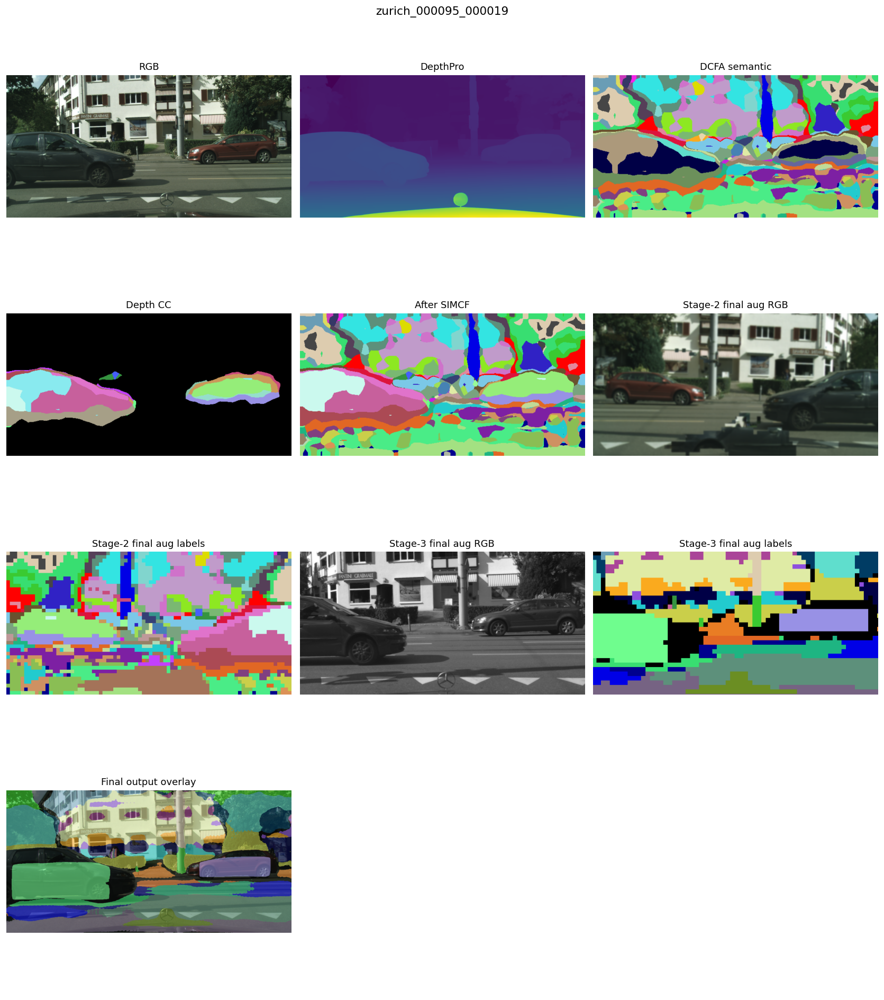

In [62]:
SUPP_OUT = PROJECT_ROOT / "figures" / "supplementary_visualizations"
SUPP_OUT.mkdir(parents=True, exist_ok=True)

for sample in SAMPLES:
    idx = sample_idx(sample)
    stage2_state = stage2_photometric_states[idx]
    stage3_state = stage3_jitter_states[idx]
    panels = [
        (sample["rgb"], "RGB", None),
        (sample["depth"], "DepthPro", "viridis"),
        (sem_to_color(sample["dcfa_sem"]), "DCFA semantic", None),
        (inst_to_color(sample["depth_cc_inst"]), "Depth CC", None),
        (panoptic_preview(sample["final_sem"], sample["final_inst"]), "After SIMCF", None),
        (stage2_state["rgb"], "Stage-2 final aug RGB", None),
        (panoptic_preview(stage2_state["sem"], stage2_state["inst"]), "Stage-2 final aug labels", None),
        (stage3_state["rgb"], "Stage-3 final aug RGB", None),
        (panoptic_preview(stage3_state["sem"], stage3_state["inst"]), "Stage-3 final aug labels", None),
        (final_output_overlay(sample), "Final output overlay", None),
    ]
    ncols = 3
    nrows = int(math.ceil(len(panels) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(14, 4 * nrows))
    axes = np.array(axes).reshape(-1)
    for ax, (image, title, cmap) in zip(axes, panels):
        ax.axis("off")
        ax.set_title(title)
        if image is not None:
            ax.imshow(image, cmap=cmap)
    for ax in axes[len(panels):]:
        ax.axis("off")
    fig.suptitle(sample["stem"], fontsize=13)
    plt.tight_layout()
    out_path = SUPP_OUT / f"{sample['stem']}_step_trace.png"
    fig.savefig(out_path, bbox_inches="tight", dpi=220)
    print(f"saved {out_path}")
    save_notebook_figure(fig, f"{sample['stem']} compact step trace")
    plt.show()